KODE TUGAS AKHIR

Nama: Syifa Frnanda

NIM: 121450094

Prodi:Sains Data

## Download data

In [ ]:
import datetime
from zoneinfo import ZoneInfo

# Buat waktu awal dan akhir tahun 2024 dalam zona WIB
start_wib = datetime.datetime(2024, 1, 1, 0, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta"))
end_wib = datetime.datetime(2024, 12, 31, 23, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta"))

# Cetak sebagai datetime
print("Start date WIB\t:", start_wib.strftime('%Y-%m-%d %H:%M:%S %Z'))
print("End date WIB\t:", end_wib.strftime('%Y-%m-%d %H:%M:%S %Z'))

# Konversi ke UTC
start_utc = start_wib.astimezone(ZoneInfo("UTC"))
end_utc = end_wib.astimezone(ZoneInfo("UTC"))

# Cetak hasilnya
print("\nStart date UTC\t:", start_utc.strftime('%Y-%m-%d %H:%M:%S %Z'))
print("End date UTC\t:", end_utc.strftime('%Y-%m-%d %H:%M:%S %Z'))

# Convert ke UNIX timestamp UTC
print("\nStart timestamp\t=", int(start_utc.timestamp()))
print("End timestamp \t=", int(end_utc.timestamp()))


Start date WIB	: 2024-01-01 00:00:00 WIB
End date WIB	: 2024-12-31 23:00:00 WIB

Start date UTC	: 2023-12-31 17:00:00 UTC
End date UTC	: 2024-12-31 16:00:00 UTC

Start timestamp	= 1704042000
End timestamp 	= 1735660800


In [ ]:
import datetime
from zoneinfo import ZoneInfo

start_ts = int(datetime.datetime(2024, 1, 1, 0, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta")).timestamp())
end_ts = int(datetime.datetime(2024, 12, 31, 23, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta")).timestamp())

print(start_ts, end_ts)


1704042000 1735660800


In [ ]:
import requests
import pandas as pd
from datetime import datetime
import numpy as np

# Define latitude, longitude, start, and end timestamps
lat = -5.4292
lon = 105.2611
start = start_utc  # 1 Januari 2024 00:00:00
end = end_utc      # 31 Desember 2024 23:00:00
api_key = 'f7dc200381fea57025caff3e960b78cf'

# Construct the URL
url = f"http://api.openweathermap.org/data/2.5/air_pollution/history?lat={lat}&lon={lon}&start={start}&end={end}&appid={api_key}"
print(url)

# Make a GET request
response = requests.get(url)

# Check if request was successful (status code 200)
if response.status_code == 200:
    data = response.json()  # Parse JSON response

    # Prepare lists to store data
    timestamps = []
    components_data = {'PM10': [], 'PM2.5': [], 'CO': [], 'NO2': [], 'SO2': [], 'O3': []}

    # Iterate over each data point in the response
    for record in data['list']:
        # Append original timestamp format (integer timestamp)
        timestamps.append(record['dt'])

        # Extract air quality components
        components = record['components']
        components_data['PM10'].append(components.get('pm10', None))
        components_data['PM2.5'].append(components.get('pm2_5', None))
        components_data['CO'].append(components.get('co', None))
        components_data['NO2'].append(components.get('no2', None))
        components_data['SO2'].append(components.get('so2', None))
        components_data['O3'].append(components.get('o3', None))

    # Create DataFrame from collected data
    df = pd.DataFrame({
        'Timestamp': timestamps,  # Keep timestamp in original format
        'PM10': components_data['PM10'],
        'PM2.5': components_data['PM2.5'],
        'CO': components_data['CO'],
        'NO2': components_data['NO2'],
        'SO2': components_data['SO2'],
        'O3': components_data['O3']
    })

    # Create DataFrame with all timestamps from start to end with NaN values for missing data
    all_dates = range(start, end + 1, 3600)  # Ensure range stops at 'end'
    all_dates_df = pd.DataFrame({'Timestamp': all_dates})

    # Merge the two DataFrames, aligning by timestamps
    df = pd.merge(all_dates_df, df, on='Timestamp', how='left')

    # Save DataFrame to CSV file
    df.to_csv('01-airpol_data_2024_balam.csv', index=False)

    print(df)
else:
    print("Error:", response.status_code)


http://api.openweathermap.org/data/2.5/air_pollution/history?lat=-5.4292&lon=105.2611&start=2023-12-31 17:00:00+00:00&end=2024-12-31 16:00:00+00:00&appid=f7dc200381fea57025caff3e960b78cf
Error: 400


In [ ]:
import datetime
from zoneinfo import ZoneInfo
import requests
import pandas as pd

# Buat waktu awal dan akhir tahun 2024 dalam zona WIB
start_wib = datetime.datetime(2024, 1, 1, 0, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta"))
end_wib = datetime.datetime(2024, 12, 31, 23, 0, 0, tzinfo=ZoneInfo("Asia/Jakarta"))

# Konversi ke UTC
start_utc = start_wib.astimezone(ZoneInfo("UTC"))
end_utc = end_wib.astimezone(ZoneInfo("UTC"))

# Convert ke UNIX timestamp (UTC)
start = int(start_utc.timestamp())  # 1704042000
end = int(end_utc.timestamp())      # 1735660800

# Cek
print("Start timestamp =", start)
print("End timestamp   =", end)

# API request
lat = -5.4292
lon = 105.2611
api_key = 'f7dc200381fea57025caff3e960b78cf'
url = f"http://api.openweathermap.org/data/2.5/air_pollution/history?lat={lat}&lon={lon}&start={start}&end={end}&appid={api_key}"
print("URL:", url)

response = requests.get(url)

if response.status_code == 200:
    data = response.json()
    timestamps = []
    components_data = {'PM10': [], 'PM2.5': [], 'CO': [], 'NO2': [], 'SO2': [], 'O3': []}

    for record in data['list']:
        timestamps.append(record['dt'])
        components = record['components']
        components_data['PM10'].append(components.get('pm10', None))
        components_data['PM2.5'].append(components.get('pm2_5', None))
        components_data['CO'].append(components.get('co', None))
        components_data['NO2'].append(components.get('no2', None))
        components_data['SO2'].append(components.get('so2', None))
        components_data['O3'].append(components.get('o3', None))

    df = pd.DataFrame({
        'Timestamp': timestamps,
        'PM10': components_data['PM10'],
        'PM2.5': components_data['PM2.5'],
        'CO': components_data['CO'],
        'NO2': components_data['NO2'],
        'SO2': components_data['SO2'],
        'O3': components_data['O3']
    })

    # Buat DataFrame lengkap dari jam ke jam
    all_dates = range(start, end + 1, 3600)
    all_dates_df = pd.DataFrame({'Timestamp': all_dates})

    df = pd.merge(all_dates_df, df, on='Timestamp', how='left')

    df.to_csv('01-airpol_data_2024.csv', index=False)
    print(df)
else:
    print("Error:", response.status_code, response.text)


Start timestamp = 1704042000
End timestamp   = 1735660800
URL: http://api.openweathermap.org/data/2.5/air_pollution/history?lat=-5.4292&lon=105.2611&start=1704042000&end=1735660800&appid=f7dc200381fea57025caff3e960b78cf
       Timestamp    PM10  PM2.5       CO    NO2    SO2    O3
0     1704042000   87.39  70.58  1468.66  21.42   6.97  0.30
1     1704045600   85.55  70.38  1375.20  15.59   4.53  0.12
2     1704049200   77.89  65.52  1214.98   9.94   2.12  0.36
3     1704052800   63.27  54.75  1054.76   7.37   1.33  0.65
4     1704056400   52.20  46.25   947.95   6.25   1.16  0.73
...          ...     ...    ...      ...    ...    ...   ...
8779  1735646400   78.27  55.65  2456.67  47.30  21.46  0.01
8780  1735650000   98.21  69.76  2670.29  45.93  23.37  0.00
8781  1735653600  120.33  86.30  2937.32  46.61  25.51  0.00
8782  1735657200  130.87  93.58  2964.02  42.16  25.27  0.00
8783  1735660800  122.01  85.65  2590.18  32.90  20.98  0.00

[8784 rows x 7 columns]


## Data Awal

In [ ]:
import pandas as pd

# Load the uploaded CSV file to inspect its structure
file_path = '/kaggle/working/01-airpol_data_2024.csv'
data = pd.read_csv(file_path, index_col=None)

# Display the first few rows of the dataset
data

,Timestamp,PM10,PM2.5,CO,NO2,SO2,O3
0,1704042000,87.39,70.58,1468.66,21.42,6.97,0.30
1,1704045600,85.55,70.38,1375.20,15.59,4.53,0.12
2,1704049200,77.89,65.52,1214.98,9.94,2.12,0.36
3,1704052800,63.27,54.75,1054.76,7.37,1.33,0.65
4,1704056400,52.20,46.25,947.95,6.25,1.16,0.73
...,...,...,...,...,...,...,...
8779,1735646400,78.27,55.65,2456.67,47.30,21.46,0.01
8780,1735650000,98.21,69.76,2670.29,45.93,23.37,0.00
8781,1735653600,120.33,86.30,2937.32,46.61,25.51,0.00
8782,1735657200,130.87,93.58,2964.02,42.16,25.27,0.00


In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Timestamp  8784 non-null   int64  
 1   PM10       8664 non-null   float64
 2   PM2.5      8664 non-null   float64
 3   CO         8664 non-null   float64
 4   NO2        8664 non-null   float64
 5   SO2        8664 non-null   float64
 6   O3         8664 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 480.5 KB


In [ ]:
data.describe()

,Timestamp,PM10,PM2.5,CO,NO2,SO2,O3
count,8.784000e+03,8664.000000,8664.000000,8664.000000,8664.000000,8664.000000,8664.000000
mean,1.719851e+09,55.885444,45.976274,1179.376776,13.472380,5.773337,25.011085
std,9.129120e+06,115.962258,36.730055,699.671731,152.788767,4.922607,30.213595
min,1.704042e+09,-9999.000000,0.590000,233.650000,-9999.000000,0.400000,0.000000
25%,1.711947e+09,22.885000,16.440000,594.140000,6.000000,2.180000,1.005000
50%,1.719851e+09,47.835000,37.600000,1014.710000,11.140000,4.410000,13.590000
75%,1.727756e+09,82.332500,66.665000,1628.880000,21.420000,7.510000,37.910000
max,1.735661e+09,299.880000,277.900000,3952.030000,100.080000,32.900000,194.550000


In [ ]:
print(data.columns)


Index(['Timestamp', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3'], dtype='object')


In [ ]:
import pandas as pd
from zoneinfo import ZoneInfo

df = data

# Konversi kolom 'Timestamp' menjadi datetime UTC
df['Waktu'] = pd.to_datetime(df['Timestamp'], unit='s', utc=True)

# Konversi ke WIB (Asia/Jakarta)
df['Waktu'] = df['Waktu'].dt.tz_convert('Asia/Jakarta')

# Hapus kolom Timestamp kalau tidak dipakai lagi
df = df.drop(columns=['Timestamp'])

# Pastikan semua kolom selain 'Waktu' adalah float
for col in df.columns:
    if col != 'Waktu':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Pindahkan 'Waktu' ke depan
cols = ['Waktu'] + [col for col in df.columns if col != 'Waktu']
df = df[cols]

# Cek struktur
df.info()

#df['Waktu'] = df['Waktu'].dt.tz_localize(None)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype                       
---  ------  --------------  -----                       
 0   Waktu   8784 non-null   datetime64[ns, Asia/Jakarta]
 1   PM10    8664 non-null   float64                     
 2   PM2.5   8664 non-null   float64                     
 3   CO      8664 non-null   float64                     
 4   NO2     8664 non-null   float64                     
 5   SO2     8664 non-null   float64                     
 6   O3      8664 non-null   float64                     
dtypes: datetime64[ns, Asia/Jakarta](1), float64(6)
memory usage: 480.5 KB


In [ ]:
df.head()

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
0,2024-01-01 00:00:00+07:00,87.39,70.58,1468.66,21.42,6.97,0.30
1,2024-01-01 01:00:00+07:00,85.55,70.38,1375.20,15.59,4.53,0.12
2,2024-01-01 02:00:00+07:00,77.89,65.52,1214.98,9.94,2.12,0.36
3,2024-01-01 03:00:00+07:00,63.27,54.75,1054.76,7.37,1.33,0.65
4,2024-01-01 04:00:00+07:00,52.20,46.25,947.95,6.25,1.16,0.73


In [ ]:
df['Waktu'] = df['Waktu'].dt.tz_localize(None)

# Konversi kolom Waktu menjadi datetime jika belum
df['Waktu'] = pd.to_datetime(df['Waktu'])


df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Waktu   8784 non-null   datetime64[ns]
 1   PM10    8664 non-null   float64       
 2   PM2.5   8664 non-null   float64       
 3   CO      8664 non-null   float64       
 4   NO2     8664 non-null   float64       
 5   SO2     8664 non-null   float64       
 6   O3      8664 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 480.5 KB


In [ ]:
df

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73
...,...,...,...,...,...,...,...
8779,2024-12-31 19:00:00,78.27,55.65,2456.67,47.30,21.46,0.01
8780,2024-12-31 20:00:00,98.21,69.76,2670.29,45.93,23.37,0.00
8781,2024-12-31 21:00:00,120.33,86.30,2937.32,46.61,25.51,0.00
8782,2024-12-31 22:00:00,130.87,93.58,2964.02,42.16,25.27,0.00


In [ ]:
df.to_csv('02-data_date_2024.csv', index=False)

df.columns

Index(['Waktu', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3'], dtype='object')

In [ ]:
# Load the uploaded CSV file to inspect its structure
import pandas as pd
file_path = '/content/02-data_date_2024.csv'
df = pd.read_csv(file_path, index_col=None)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Waktu   8784 non-null   object 
 1   PM10    8664 non-null   float64
 2   PM2.5   8664 non-null   float64
 3   CO      8664 non-null   float64
 4   NO2     8664 non-null   float64
 5   SO2     8664 non-null   float64
 6   O3      8664 non-null   float64
dtypes: float64(6), object(1)
memory usage: 480.5+ KB


In [ ]:
# Konversi kolom Waktu menjadi datetime jika belum
df['Waktu'] = pd.to_datetime(df['Waktu'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Waktu   8784 non-null   datetime64[ns]
 1   PM10    8664 non-null   float64       
 2   PM2.5   8664 non-null   float64       
 3   CO      8664 non-null   float64       
 4   NO2     8664 non-null   float64       
 5   SO2     8664 non-null   float64       
 6   O3      8664 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 480.5 KB


In [ ]:
# Cek missing value di seluruh dataframe
ada_missing_value = df.isnull().any().any()
print(f"Apakah ada missing value di dataframe: {ada_missing_value}")

# Cek missing value per kolom
missing_value_per_kolom = df.isnull().any()
print("\nMissing value per kolom:")
print(missing_value_per_kolom)

# Cek jumlah missing value per kolom
jumlah_missing_value_per_kolom = df.isnull().sum()
print("\nJumlah missing value per kolom:")
print(jumlah_missing_value_per_kolom)

Apakah ada missing value di dataframe: True

Missing value per kolom:
Waktu    False
PM10      True
PM2.5     True
CO        True
NO2       True
SO2       True
O3        True
dtype: bool

Jumlah missing value per kolom:
Waktu      0
PM10     120
PM2.5    120
CO       120
NO2      120
SO2      120
O3       120
dtype: int64


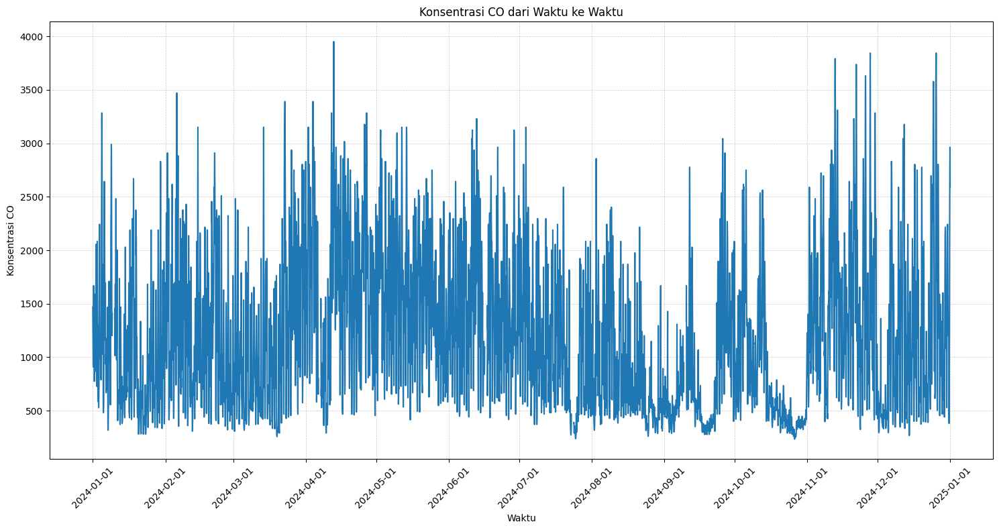

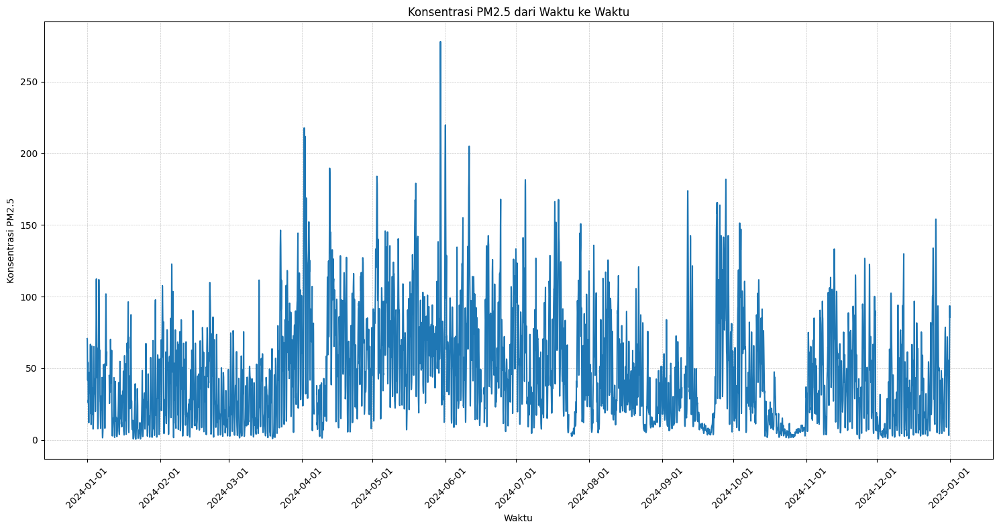

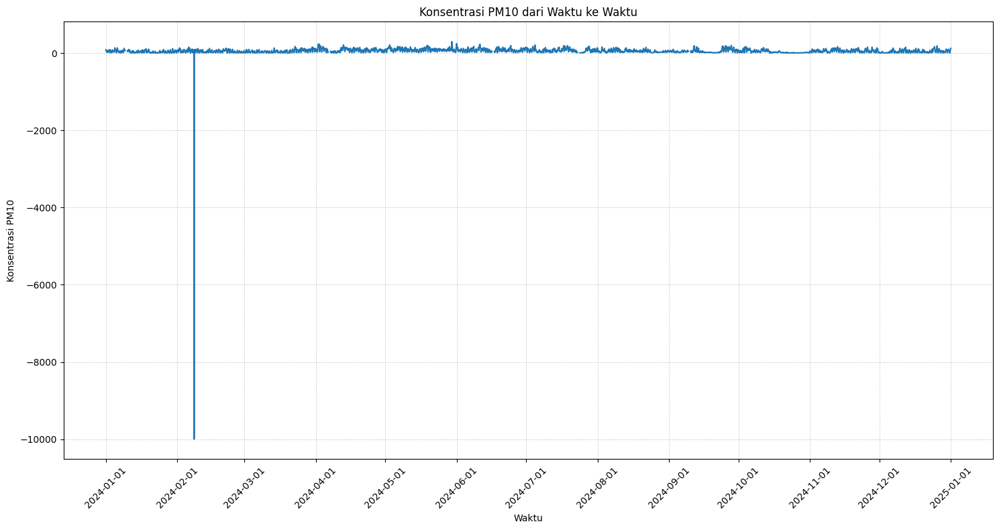

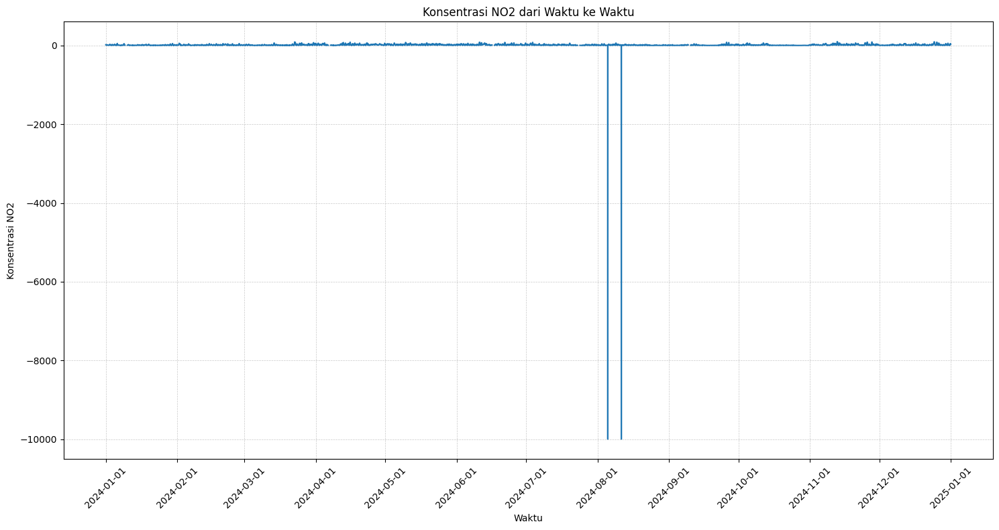

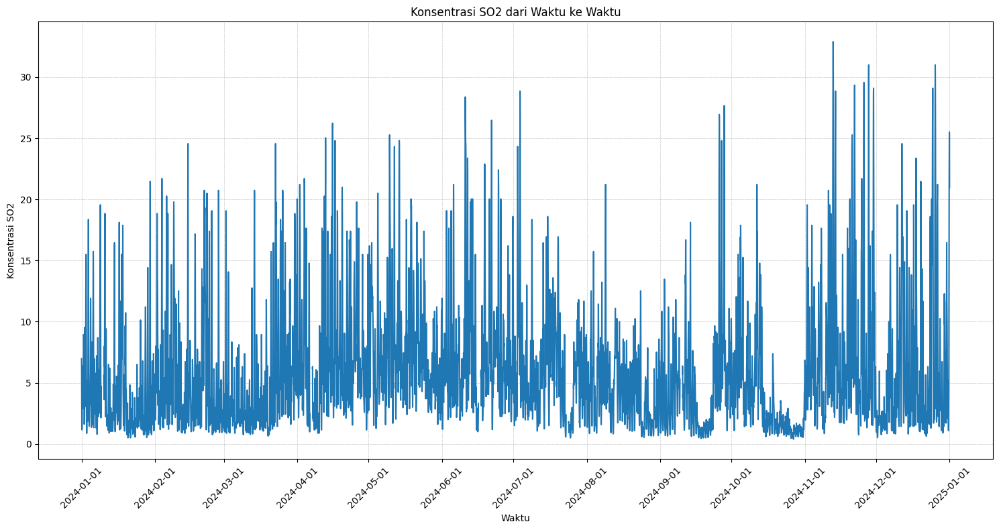

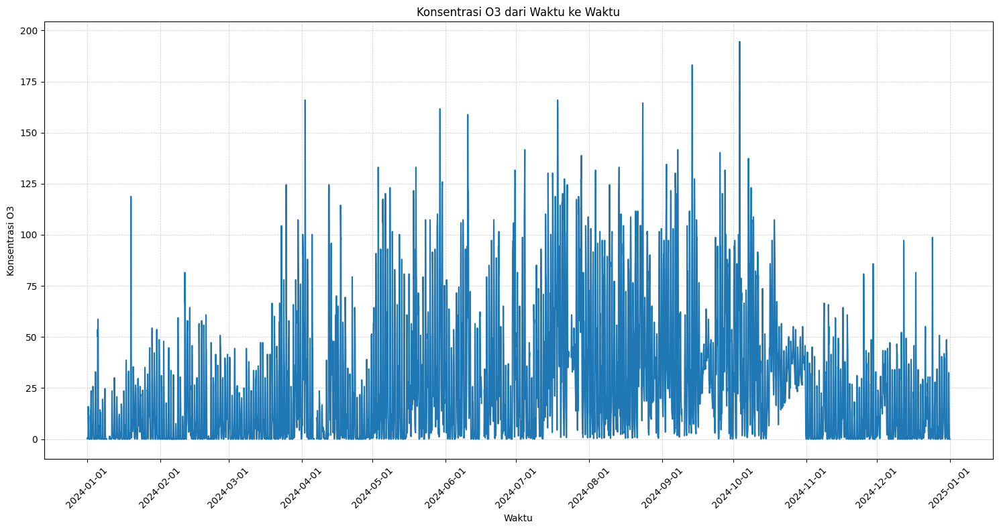

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Tentukan semua kolom pencemar udara (selain waktu dan ISPU jika ada)
columns_to_plot = ['CO', 'PM2.5', 'PM10', 'NO2', 'SO2', 'O3']

# Loop untuk plot setiap kolom
for col in columns_to_plot:
    plt.figure(figsize=(15, 8))
    plt.plot(df['Waktu'], df[col], label=col)

    # Format sumbu x untuk menampilkan tahun-bulan-tanggal
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.xticks(rotation=45)

    # Set label dan judul
    plt.xlabel('Waktu')
    plt.ylabel(f'Konsentrasi {col}')
    plt.title(f'Konsentrasi {col} dari Waktu ke Waktu')

    # Tambahkan garis grid XY
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    #plt.legend()
    plt.tight_layout()
    plt.show()


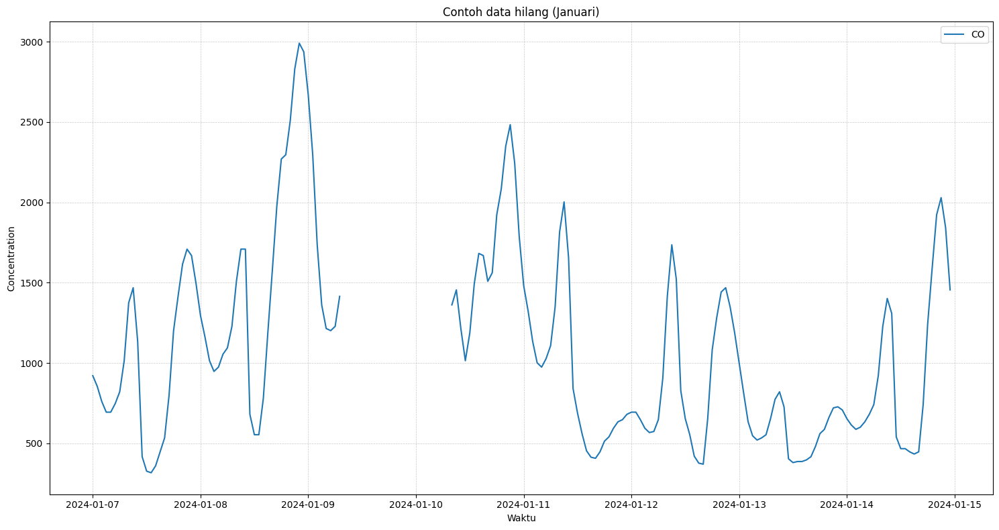

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Tentukan rentang waktu yang diinginkan
start_time = '2024-01-07 00:00:00'
end_time = '2024-01-14 23:00:00'

# Filter data berdasarkan rentang waktu
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Tentukan kolom yang ingin diplot
columns_to_plot = ['CO']

# Plot data
plt.figure(figsize=(15, 8))

for col in columns_to_plot:
    # Plot garis untuk kolom yang ada datanya
    plt.plot(df_filtered['Waktu'], df_filtered[col], label=col)

    # Highlight missing values dengan warna lain
    #plt.fill_between(df_filtered['Waktu'], df_filtered[col], where=df_filtered[col].isnull(), color='red', alpha=0.3, label=f'Missing {col}' if col == columns_to_plot[0] else "")

# Set labels dan title
plt.xlabel('Waktu')
plt.ylabel('Concentration')
plt.title('Contoh data hilang (Januari)')
plt.legend(loc='upper right')

# Tambahkan garis grid XY
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Tampilkan plot
plt.tight_layout()
plt.show()


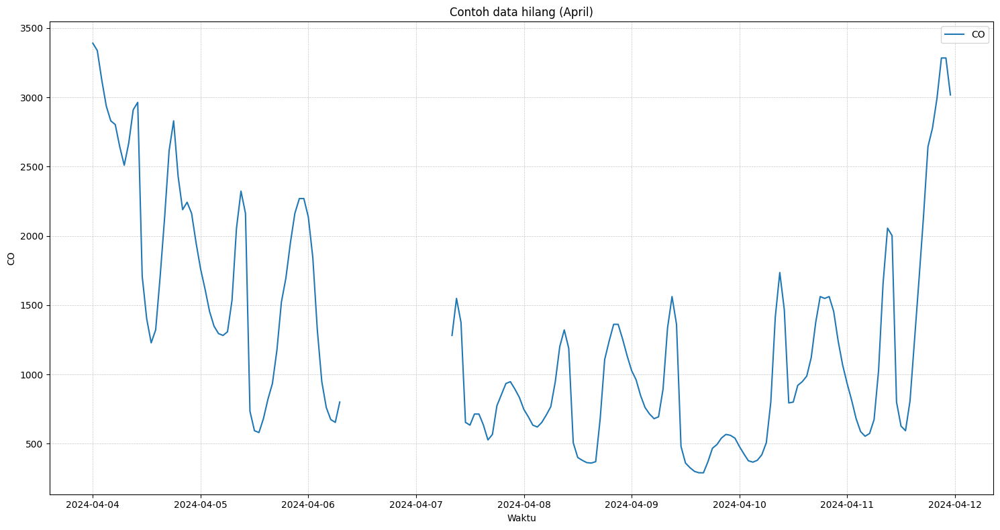

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Konversi kolom Waktu menjadi datetime jika belum
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan rentang waktu yang diinginkan
start_time = '2024-04-04 00:00:00'
end_time = '2024-04-11 23:00:00'

# Filter data berdasarkan rentang waktu
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Tentukan kolom yang ingin diplot
columns_to_plot = ['CO']

# Plot data
plt.figure(figsize=(15, 8))

for col in columns_to_plot:
    # Plot garis untuk kolom yang ada datanya
    plt.plot(df_filtered['Waktu'], df_filtered[col], label=col)

# Set labels dan title
plt.xlabel('Waktu')
plt.ylabel('CO')
plt.title('Contoh data hilang (April)')
plt.legend(loc='upper right')

# Tambahkan garis grid XY
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Tampilkan plot
plt.tight_layout()
plt.show()


In [ ]:
# Melihat baris dengan nilai NaN pada kolom manapun
df_missing_before = df[df.isna().any(axis=1)]
df_missing_before

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
200,2024-01-09 08:00:00,NaN,NaN,NaN,NaN,NaN,NaN
201,2024-01-09 09:00:00,NaN,NaN,NaN,NaN,NaN,NaN
202,2024-01-09 10:00:00,NaN,NaN,NaN,NaN,NaN,NaN
203,2024-01-09 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN
204,2024-01-09 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
6075,2024-09-10 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6076,2024-09-10 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6077,2024-09-10 05:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6078,2024-09-10 06:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
import pandas as pd

# Ambil hanya tanggal (tanpa waktu)
df['Date'] = df['Waktu'].dt.date

# Filter baris yang memiliki NaN di kolom tertentu, misalnya 'CO'
df_nan = df[df['CO'].isna()]

# Mengelompokkan berdasarkan tanggal dan memilih baris yang memiliki NaN
df_nan_daily = df_nan.groupby('Date').first().reset_index()

# Menampilkan hasil
print(df_nan_daily)

         Date               Waktu  PM10  PM2.5  CO  NO2  SO2  O3
0  2024-01-09 2024-01-09 08:00:00   NaN    NaN NaN  NaN  NaN NaN
1  2024-01-10 2024-01-10 00:00:00   NaN    NaN NaN  NaN  NaN NaN
2  2024-04-06 2024-04-06 08:00:00   NaN    NaN NaN  NaN  NaN NaN
3  2024-04-07 2024-04-07 00:00:00   NaN    NaN NaN  NaN  NaN NaN
4  2024-06-16 2024-06-16 08:00:00   NaN    NaN NaN  NaN  NaN NaN
5  2024-06-17 2024-06-17 00:00:00   NaN    NaN NaN  NaN  NaN NaN
6  2024-07-23 2024-07-23 08:00:00   NaN    NaN NaN  NaN  NaN NaN
7  2024-07-24 2024-07-24 00:00:00   NaN    NaN NaN  NaN  NaN NaN
8  2024-09-09 2024-09-09 08:00:00   NaN    NaN NaN  NaN  NaN NaN
9  2024-09-10 2024-09-10 00:00:00   NaN    NaN NaN  NaN  NaN NaN


In [ ]:
import pandas as pd

# Ambil hanya jam (tanpa tanggal)
df['Hour'] = df['Waktu'].dt.hour

# Filter baris yang memiliki NaN di kolom tertentu, misalnya 'CO'
df_nan = df[df['CO'].isna()]

# Mengelompokkan berdasarkan jam dan menghitung total missing value di setiap jam
df_nan_hourly = df_nan.groupby('Hour').size().reset_index(name='Total Missing')

# Menampilkan hasil
print(df_nan_hourly)


    Hour  Total Missing
0      0              5
1      1              5
2      2              5
3      3              5
4      4              5
5      5              5
6      6              5
7      7              5
8      8              5
9      9              5
10    10              5
11    11              5
12    12              5
13    13              5
14    14              5
15    15              5
16    16              5
17    17              5
18    18              5
19    19              5
20    20              5
21    21              5
22    22              5
23    23              5


In [ ]:
df.columns

Index(['Waktu', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3', 'Date', 'Hour'], dtype='object')

In [ ]:
df.head()

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,Date,Hour
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30,2024-01-01,0
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12,2024-01-01,1
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36,2024-01-01,2
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65,2024-01-01,3
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73,2024-01-01,4


In [ ]:
df = df.drop(columns=['Date', 'Hour'])

df.columns

Index(['Waktu', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3'], dtype='object')

In [ ]:
import pandas as pd

# Fungsi untuk menghitung persentase missing value
def calculate_missing_percentage(df):
    missing_percentage = (df.isnull().sum() / len(df)) * 100
    return missing_percentage

# Contoh DataFrame
# df = pd.read_csv('your_dataset.csv')

# Hitung persentase missing value
missing_percentage = calculate_missing_percentage(df)

# Tampilkan hasil
print("Persentase Missing Value per Kolom:")
print(missing_percentage)


Persentase Missing Value per Kolom:
Waktu    0.00000
PM10     1.36612
PM2.5    1.36612
CO       1.36612
NO2      1.36612
SO2      1.36612
O3       1.36612
dtype: float64


In [ ]:
# Remove rows with any missing values
#df = df.dropna()

# Display the shape of the DataFrame after removing missing values
df.shape


(8784, 7)

In [ ]:
df.describe()


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
count,8784,8664.000000,8664.000000,8664.000000,8664.000000,8664.000000,8664.000000
mean,2024-07-01 23:30:00,55.885444,45.976274,1179.376776,13.472380,5.773337,25.011085
min,2024-01-01 00:00:00,-9999.000000,0.590000,233.650000,-9999.000000,0.400000,0.000000
25%,2024-04-01 11:45:00,22.885000,16.440000,594.140000,6.000000,2.180000,1.005000
50%,2024-07-01 23:30:00,47.835000,37.600000,1014.710000,11.140000,4.410000,13.590000
75%,2024-10-01 11:15:00,82.332500,66.665000,1628.880000,21.420000,7.510000,37.910000
max,2024-12-31 23:00:00,299.880000,277.900000,3952.030000,100.080000,32.900000,194.550000
std,NaN,115.962258,36.730055,699.671731,152.788767,4.922607,30.213595


In [ ]:
# Menampilkan baris yang terdeteksi duplikat (seluruh kolom)
df_duplicated = df[df.duplicated()]
print(df_duplicated)

Empty DataFrame
Columns: [Waktu, PM10, PM2.5, CO, NO2, SO2, O3]
Index: []


In [ ]:
# Cek nilai negatif di semua kolom numerik
negative_values = (df.select_dtypes(include=['number']) < 0).sum()

# Tampilkan hasil
print("Jumlah nilai negatif per kolom:")
print(negative_values)

# Jika ingin melihat baris dengan nilai negatif
negative_rows = df[(df.select_dtypes(include=['number']) < 0).any(axis=1)]
print("Baris dengan nilai negatif:")
negative_rows

Jumlah nilai negatif per kolom:
PM10     1
PM2.5    0
CO       0
NO2      2
SO2      0
O3       0
dtype: int64
Baris dengan nilai negatif:


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
918,2024-02-08 06:00:00,-9999.00,38.32,921.25,2.23,1.97,0.00
5218,2024-08-05 10:00:00,62.16,49.02,1321.79,-9999.00,6.20,47.92
5359,2024-08-11 07:00:00,26.83,17.05,607.49,-9999.00,2.12,2.68


In [ ]:
import numpy as np

# Mengganti nilai negatif dengan NaN untuk semua kolom numerik
df[df.select_dtypes(include=['number']) < 0] = np.nan

# Hitung jumlah nilai negatif yang telah diubah menjadi NaN
negative_values = (df.select_dtypes(include=['number']) < 0).sum()

# Tampilkan hasil
print("Jumlah nilai negatif per kolom setelah diubah menjadi NaN:")
print(negative_values)

# Jika ingin melihat baris yang sebelumnya memiliki nilai negatif
negative_rows = df[df.isna().any(axis=1)]
print("Baris yang memiliki nilai NaN:")
negative_rows


Jumlah nilai negatif per kolom setelah diubah menjadi NaN:
PM10     0
PM2.5    0
CO       0
NO2      0
SO2      0
O3       0
dtype: int64
Baris yang memiliki nilai NaN:


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
200,2024-01-09 08:00:00,NaN,NaN,NaN,NaN,NaN,NaN
201,2024-01-09 09:00:00,NaN,NaN,NaN,NaN,NaN,NaN
202,2024-01-09 10:00:00,NaN,NaN,NaN,NaN,NaN,NaN
203,2024-01-09 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN
204,2024-01-09 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
6075,2024-09-10 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6076,2024-09-10 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6077,2024-09-10 05:00:00,NaN,NaN,NaN,NaN,NaN,NaN
6078,2024-09-10 06:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Cek jumlah missing value per kolom
jumlah_missing_value_per_kolom = df.isnull().sum()
print("\nJumlah missing value per kolom:")
print(jumlah_missing_value_per_kolom)


Jumlah missing value per kolom:
Waktu      0
PM10     121
PM2.5    120
CO       120
NO2      122
SO2      120
O3       120
dtype: int64


In [ ]:
import pandas as pd

# Fungsi untuk menghitung persentase missing value
def calculate_missing_percentage(df):
    missing_percentage = (df.isnull().sum() / len(df)) * 100
    return missing_percentage

# Contoh DataFrame
# df = pd.read_csv('your_dataset.csv')

# Hitung persentase missing value
missing_percentage = calculate_missing_percentage(df)

# Tampilkan hasil
print("Persentase Missing and Negative Value per Kolom:")
print(missing_percentage)


Persentase Missing and Negative Value per Kolom:
Waktu    0.000000
PM10     1.377505
PM2.5    1.366120
CO       1.366120
NO2      1.388889
SO2      1.366120
O3       1.366120
dtype: float64


In [ ]:
print(df.columns)
df.head()

Index(['Waktu', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3'], dtype='object')


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73


In [ ]:
df.tail()

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
8779,2024-12-31 19:00:00,78.27,55.65,2456.67,47.30,21.46,0.01
8780,2024-12-31 20:00:00,98.21,69.76,2670.29,45.93,23.37,0.00
8781,2024-12-31 21:00:00,120.33,86.30,2937.32,46.61,25.51,0.00
8782,2024-12-31 22:00:00,130.87,93.58,2964.02,42.16,25.27,0.00
8783,2024-12-31 23:00:00,122.01,85.65,2590.18,32.90,20.98,0.00


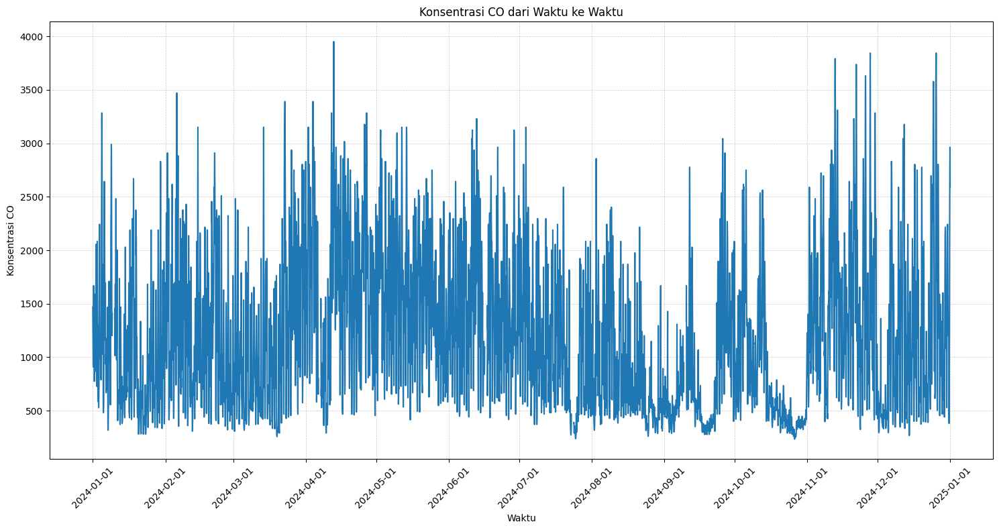

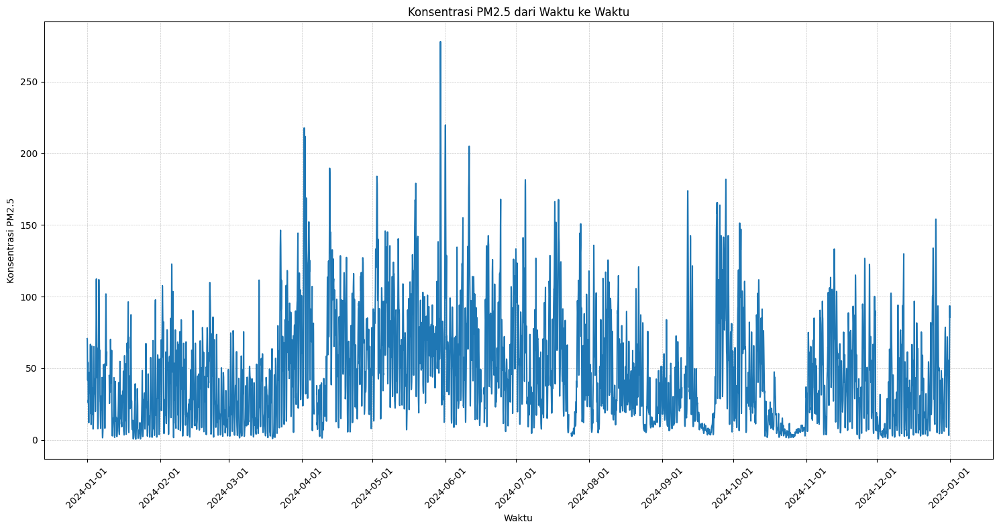

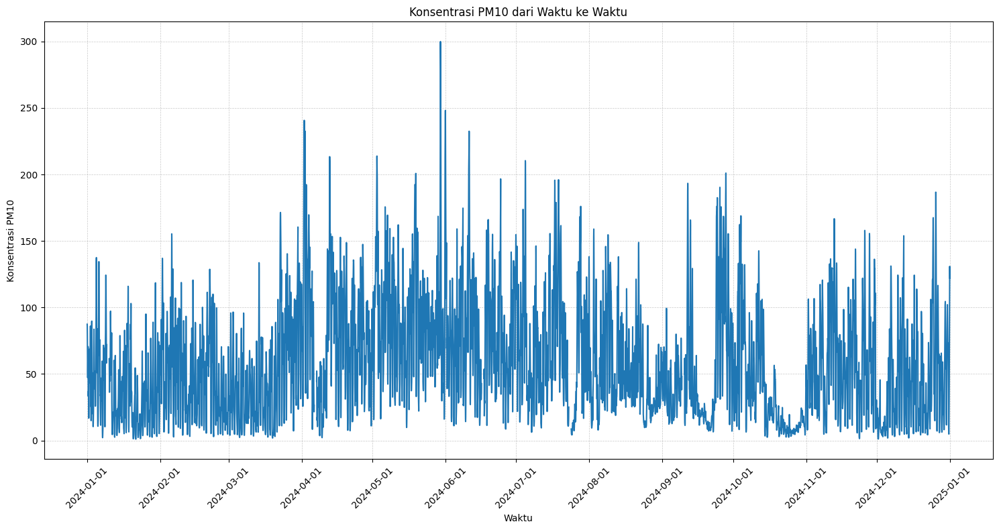

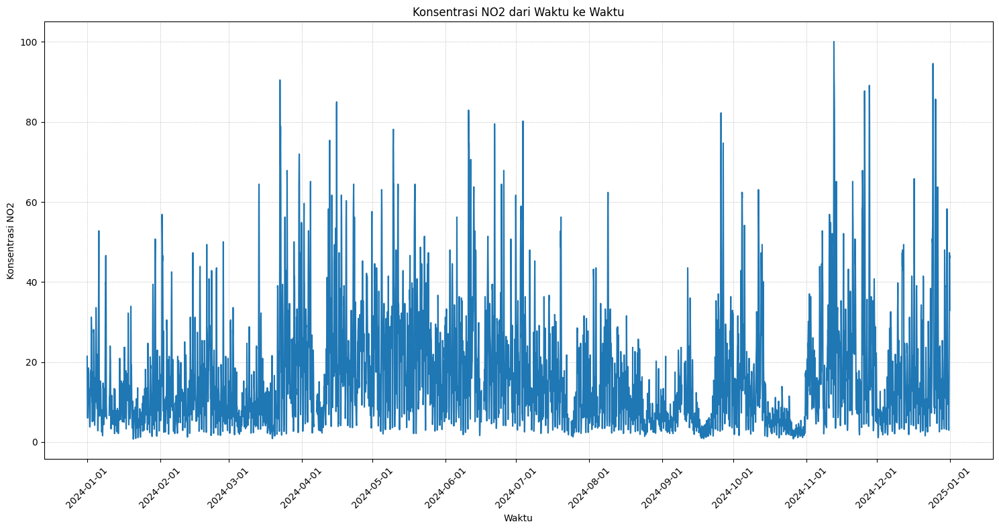

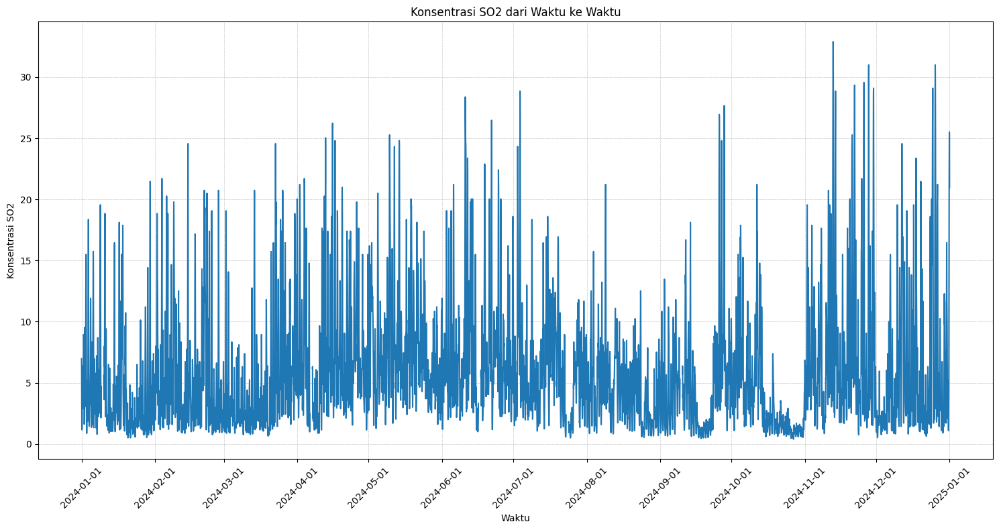

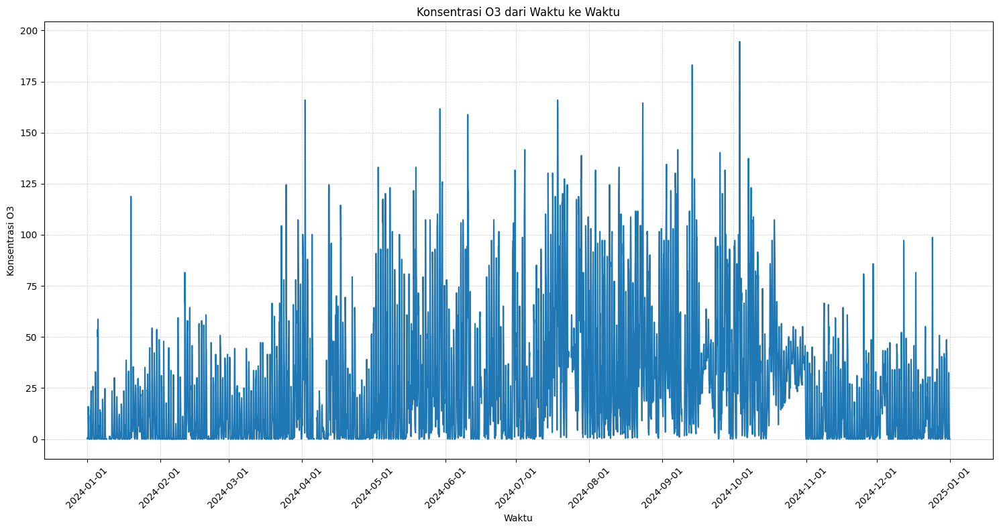

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Tentukan semua kolom pencemar udara (selain waktu dan ISPU jika ada)
columns_to_plot = ['CO', 'PM2.5', 'PM10', 'NO2', 'SO2', 'O3']

# Loop untuk plot setiap kolom
for col in columns_to_plot:
    plt.figure(figsize=(15, 8))
    plt.plot(df['Waktu'], df[col], label=col)

    # Format sumbu x untuk menampilkan tahun-bulan-tanggal
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.xticks(rotation=45)

    # Set label dan judul
    plt.xlabel('Waktu')
    plt.ylabel(f'Konsentrasi {col}')
    plt.title(f'Konsentrasi {col} dari Waktu ke Waktu')

    # Tambahkan garis grid XY
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    #plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
df.to_csv('03-data_date-bersih.csv', index=False)


## imputasi

### data prep

In [ ]:
import pandas as pd

# Load CSV dan parse kolom 'Waktu' sebagai datetime
file_path = '/kaggle/working/03-data_date-bersih.csv'
df = pd.read_csv(file_path, parse_dates=['Waktu'])

# Display the first few rows of the dataset
df

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73
...,...,...,...,...,...,...,...
8779,2024-12-31 19:00:00,78.27,55.65,2456.67,47.30,21.46,0.01
8780,2024-12-31 20:00:00,98.21,69.76,2670.29,45.93,23.37,0.00
8781,2024-12-31 21:00:00,120.33,86.30,2937.32,46.61,25.51,0.00
8782,2024-12-31 22:00:00,130.87,93.58,2964.02,42.16,25.27,0.00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Waktu   8784 non-null   datetime64[ns]
 1   PM10    8663 non-null   float64       
 2   PM2.5   8664 non-null   float64       
 3   CO      8664 non-null   float64       
 4   NO2     8662 non-null   float64       
 5   SO2     8664 non-null   float64       
 6   O3      8664 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 480.5 KB


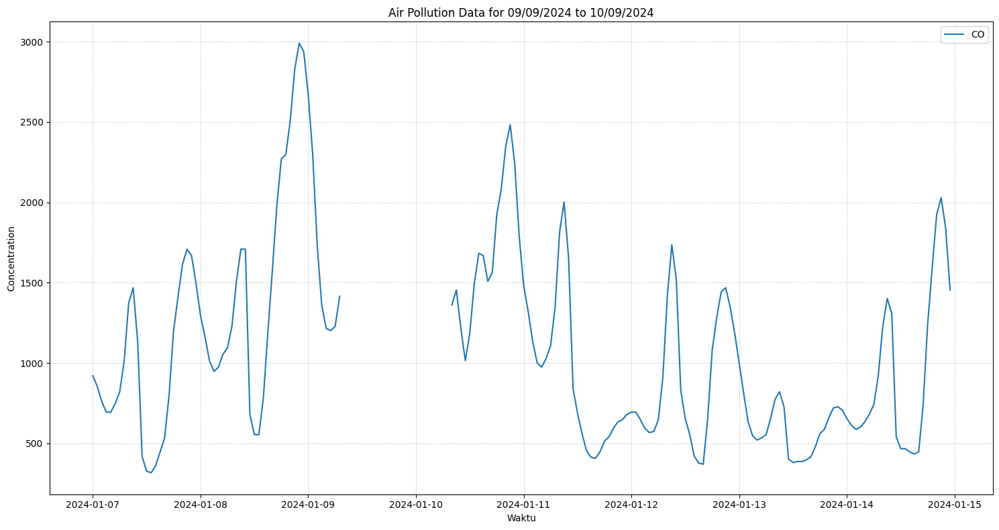

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Konversi kolom Waktu menjadi datetime jika belum
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan rentang waktu yang diinginkan
start_time = '2024-01-07 00:00:00'
end_time = '2024-01-14 23:00:00'

# Filter data berdasarkan rentang waktu
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Tentukan kolom yang ingin diplot
columns_to_plot = ['CO']

# Plot data
plt.figure(figsize=(15, 8))

for col in columns_to_plot:
    # Plot garis untuk kolom yang ada datanya
    plt.plot(df_filtered['Waktu'], df_filtered[col], label=col)

# Set labels dan title
plt.xlabel('Waktu')
plt.ylabel('Concentration')
plt.title('Air Pollution Data for 09/09/2024 to 10/09/2024')
plt.legend(loc='upper right')

# Tambahkan garis grid XY
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Tampilkan plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Ambil hanya jam dari waktu
df['Hour'] = df['Waktu'].dt.hour

# Daftar kolom polutan
polutants = ['PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3']

# Hitung rata-rata tiap jam untuk semua polutan
hourly_avg = df.groupby('Hour')[polutants].mean().reset_index()

# Menampilkan hasil
print("Rata-rata konsentrasi tiap jam:")
print(hourly_avg)


Rata-rata konsentrasi tiap jam:
    Hour       PM10      PM2.5           CO        NO2        SO2         O3
0      0  77.353823  61.045928  1443.268504  19.749557   6.722355   9.730720
1      1  70.455512  56.704709  1307.969446  17.343463   5.536177   9.970970
2      2  63.109141  51.579917  1138.765125  14.254598   4.225845  10.536704
3      3  58.041440  47.960166  1021.357479  12.123019   3.509889  10.529114
4      4  55.746565  46.449612   966.730997  11.073850   3.266260  10.476510
5      5  54.371413  45.625402   948.239030  10.617590   3.226094  10.474238
6      6  53.808417  45.020803   957.623573  10.726704   3.387285   9.804626
7      7  59.643767  48.574875  1111.359307  12.666333   4.707479   8.031274
8      8  66.861274  53.179474  1391.952382  15.195457   6.500554   9.985291
9      9  71.496094  56.393352  1566.797091  17.493573   6.789612  16.298809
10    10  69.678726  55.394792  1467.548864  16.973222   5.756953  32.730693
11    11  31.510028  26.165346   703.770471 

### Mean ToD

In [ ]:
# Asumsikan df sudah memiliki kolom 'hour' sebelumnya

# Daftar kolom yang ingin diimputasi
columns = ['PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3']

# Proses imputasi Mean Time-of-Day (ToD) berdasarkan kolom 'hour' yang sudah ada
for col in columns:
    # Hitung mean per jam
    mean_per_hour = df.groupby('Hour')[col].transform('mean')
    # Imputasi hanya nilai NaN
    df[col] = df[col].fillna(mean_per_hour)

# Hapus kolom 'hour' setelah imputasi
df.drop(columns=['Hour'], inplace=True)

# Lihat hasil imputasi
print(df.head())


                Waktu   PM10  PM2.5       CO    NO2   SO2    O3
0 2024-01-01 00:00:00  87.39  70.58  1468.66  21.42  6.97  0.30
1 2024-01-01 01:00:00  85.55  70.38  1375.20  15.59  4.53  0.12
2 2024-01-01 02:00:00  77.89  65.52  1214.98   9.94  2.12  0.36
3 2024-01-01 03:00:00  63.27  54.75  1054.76   7.37  1.33  0.65
4 2024-01-01 04:00:00  52.20  46.25   947.95   6.25  1.16  0.73


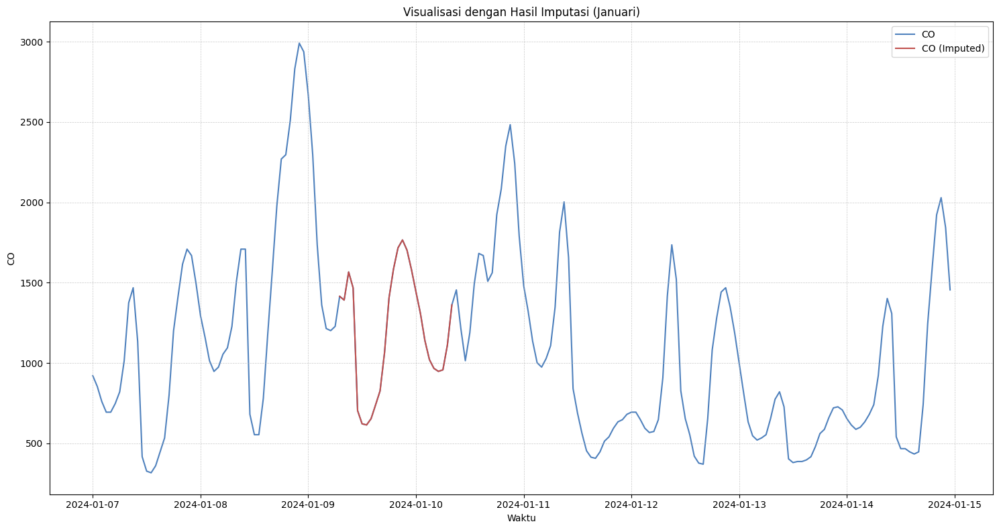

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Pastikan kolom waktu dalam format datetime
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Filter data dari 7 Jan sampai 14 Jan
start_time = '2024-01-07 00:00:00'
end_time = '2024-01-14 23:00:00'
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Rentang waktu imputasi
highlight_start = pd.to_datetime('2024-01-09 07:00:00')
highlight_end = pd.to_datetime('2024-01-10 08:00:00')

# Plot utama (semua garis biru dulu)
plt.figure(figsize=(15, 8))
plt.plot(df_filtered['Waktu'], df_filtered['CO'], label='CO', color='#4F81BD', zorder=1)

# Overlay: Plot garis merah di rentang waktu imputasi (di atas garis biru)
df_highlight = df_filtered[(df_filtered['Waktu'] >= highlight_start) & (df_filtered['Waktu'] <= highlight_end)]
plt.plot(df_highlight['Waktu'], df_highlight['CO'], label='CO (Imputed)', color='#C0504D', zorder=2)

# Label dan keterangan
plt.xlabel('Waktu')
plt.ylabel('CO')
plt.title('Visualisasi dengan Hasil Imputasi (Januari)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


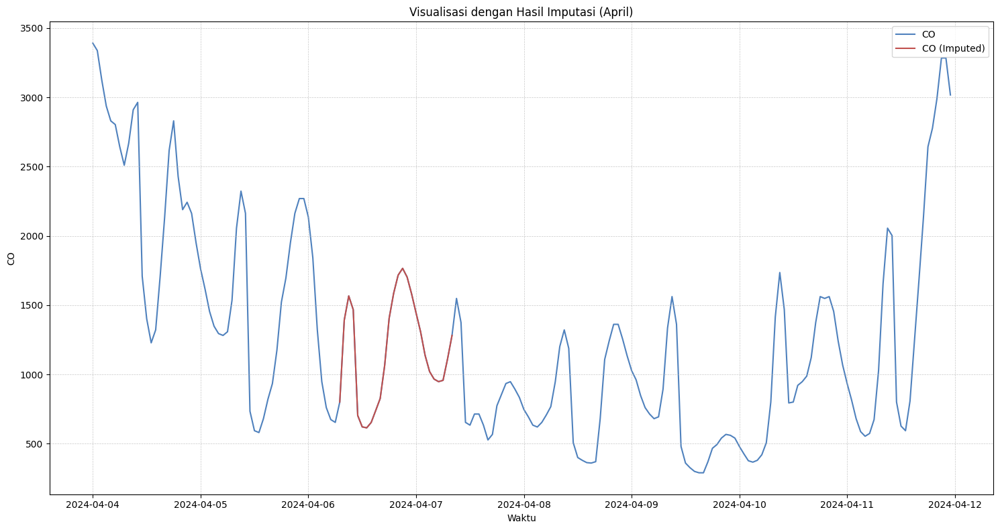

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Pastikan kolom waktu dalam format datetime
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan rentang waktu yang diinginkan
start_time = '2024-04-04 00:00:00'
end_time = '2024-04-11 23:00:00'
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Rentang waktu imputasi
highlight_start = pd.to_datetime('2024-04-06 07:00:00')
highlight_end = pd.to_datetime('2024-04-07 08:00:00')

# Plot utama (semua garis biru dulu)
plt.figure(figsize=(15, 8))
plt.plot(df_filtered['Waktu'], df_filtered['CO'], label='CO', color='#4F81BD', zorder=1)

# Overlay: Plot garis merah di rentang waktu imputasi (di atas garis biru)
df_highlight = df_filtered[(df_filtered['Waktu'] >= highlight_start) & (df_filtered['Waktu'] <= highlight_end)]
plt.plot(df_highlight['Waktu'], df_highlight['CO'], label='CO (Imputed)', color='#C0504D', zorder=2)

# Label dan keterangan
plt.xlabel('Waktu')
plt.ylabel('CO')
plt.title('Visualisasi dengan Hasil Imputasi (April)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


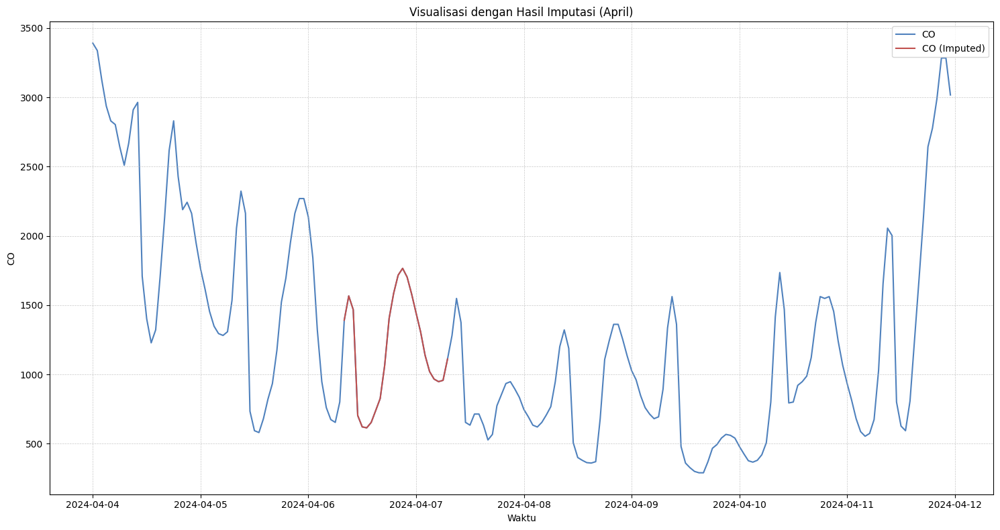

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Pastikan kolom waktu dalam format datetime
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan rentang waktu yang diinginkan
start_time = '2024-04-04 00:00:00'
end_time = '2024-04-11 23:00:00'
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Rentang waktu imputasi
highlight_start = pd.to_datetime('2024-04-06 08:00:00')
highlight_end = pd.to_datetime('2024-04-07 07:00:00')

# Plot utama (semua garis biru dulu)
plt.figure(figsize=(15, 8))
plt.plot(df_filtered['Waktu'], df_filtered['CO'], label='CO', color='#4F81BD', zorder=1)

# Overlay: Plot garis merah di rentang waktu imputasi (di atas garis biru)
df_highlight = df_filtered[(df_filtered['Waktu'] >= highlight_start) & (df_filtered['Waktu'] <= highlight_end)]
plt.plot(df_highlight['Waktu'], df_highlight['CO'], label='CO (Imputed)', color='#C0504D', zorder=2)

# Label dan keterangan
plt.xlabel('Waktu')
plt.ylabel('CO')
plt.title('Visualisasi dengan Hasil Imputasi (April)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
# Cek jumlah missing value per kolom
jumlah_missing_value_setelah_imputasi = df.isnull().sum()
print("\nJumlah missing value per kolom:")
print(jumlah_missing_value_setelah_imputasi)


Jumlah missing value per kolom:
Waktu    0
PM10     0
PM2.5    0
CO       0
NO2      0
SO2      0
O3       0
dtype: int64


In [ ]:
# Cek nilai negatif di semua kolom numerik
negative_values = (df.select_dtypes(include=['number']) < 0).sum()

# Tampilkan hasil
print("Jumlah nilai negatif per kolom:")
print(negative_values)

# Jika ingin melihat baris dengan nilai negatif
negative_rows = df[(df.select_dtypes(include=['number']) < 0).any(axis=1)]
print("Baris dengan nilai negatif:")
negative_rows

Jumlah nilai negatif per kolom:
PM10     0
PM2.5    0
CO       0
NO2      0
SO2      0
O3       0
dtype: int64
Baris dengan nilai negatif:


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3


In [ ]:
# Tanggal dan waktu yang ingin dicek (tetap sebagai string)
dates_to_check_str = [
    "2024-02-08 06:00:00",
    "2024-08-05 10:00:00",
    "2024-08-11 07:00:00"
]

# --- Solusi yang direkomendasikan ---
# Konversi `dates_to_check_str` menjadi objek datetime
dates_to_check_dt = pd.to_datetime(dates_to_check_str)

# Filter data berdasarkan kolom Waktu
selected_data = df[df['Waktu'].isin(dates_to_check_dt)]

selected_data

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3
918,2024-02-08 06:00:00,53.808417,38.32,921.25,2.230000,1.97,0.00
5218,2024-08-05 10:00:00,62.160000,49.02,1321.79,16.973222,6.20,47.92
5359,2024-08-11 07:00:00,26.830000,17.05,607.49,12.666333,2.12,2.68


Visualisasi untuk 6 polutan telah disimpan di folder: pollutant_imputation_plots


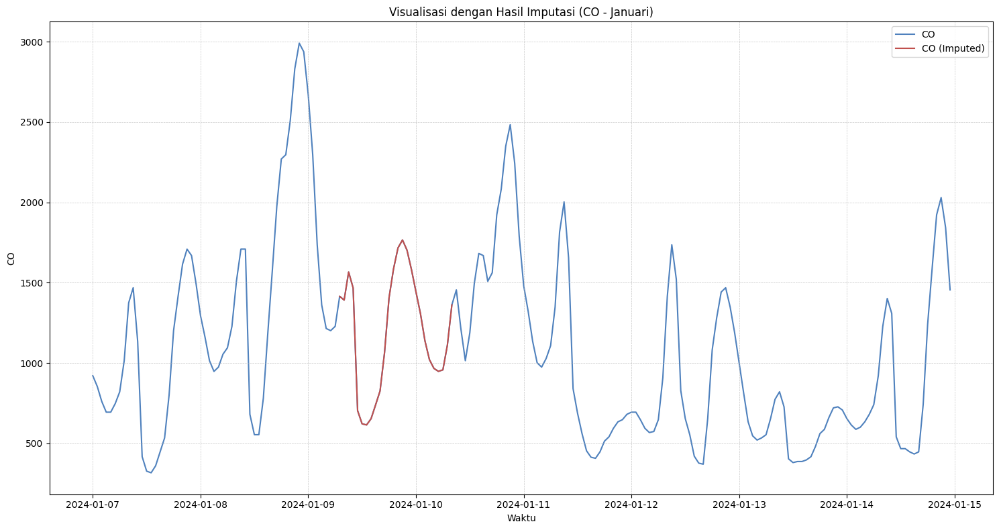

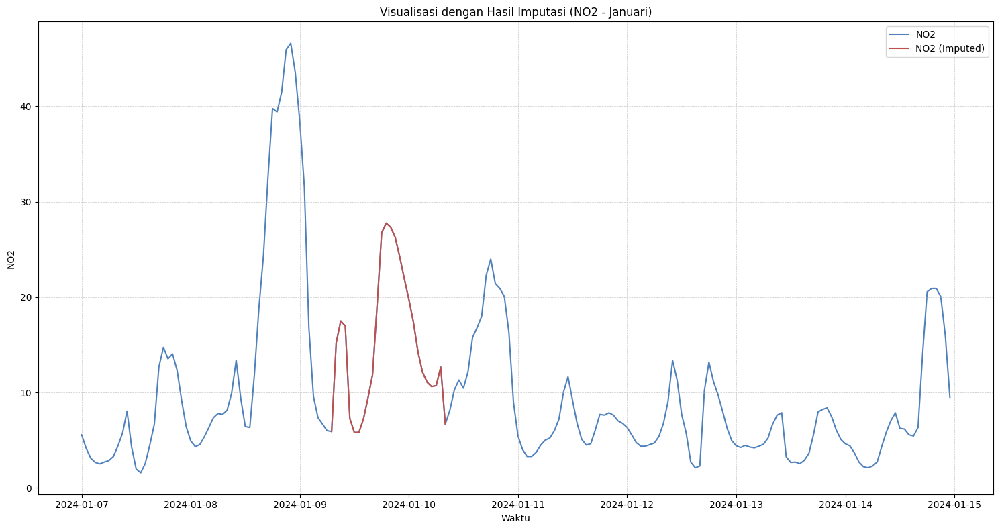

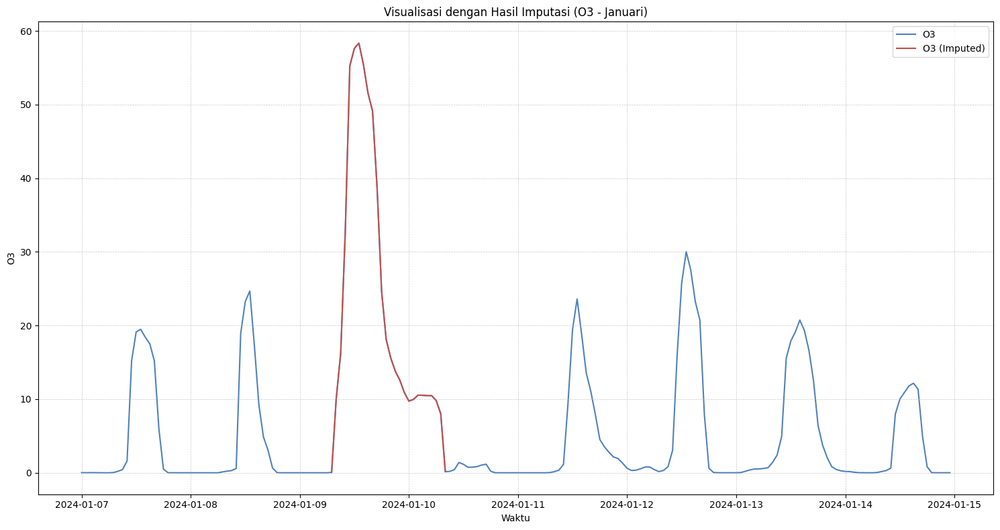

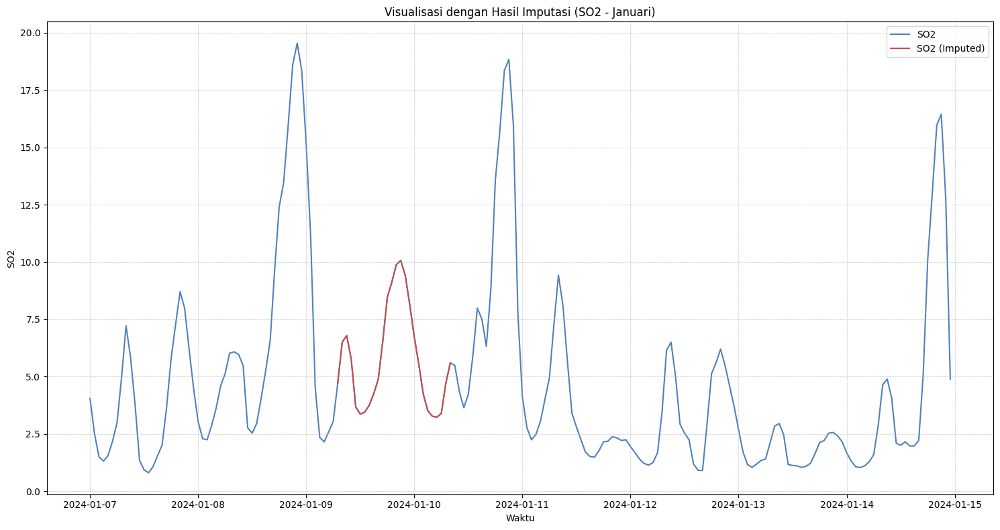

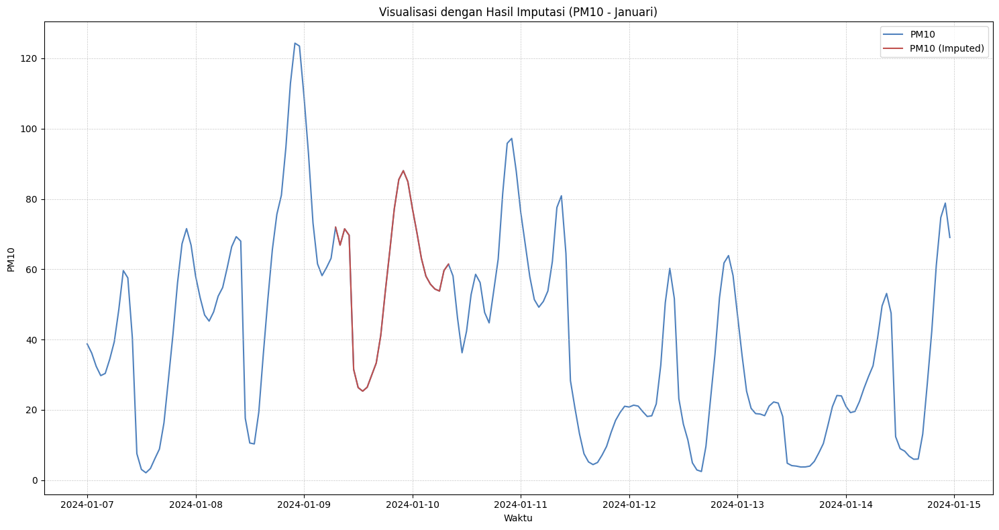

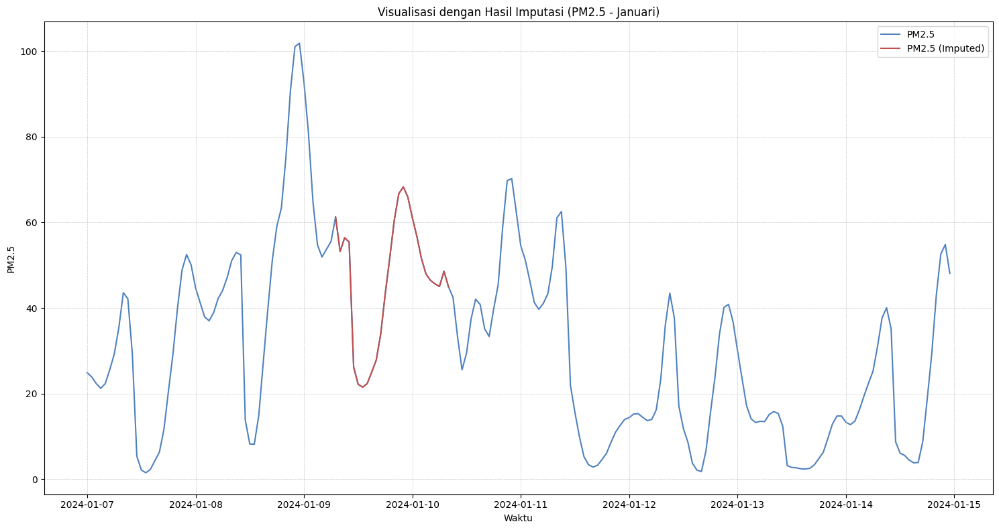

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Make sure your DataFrame 'df' is loaded.
# If you haven't loaded it yet, uncomment and modify the line below:
# df = pd.read_csv('path/to/your/05-data_ISPU_2024.csv')

# Ensure the 'Waktu' column is in datetime format
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Filter data from January 7th to January 14th
start_time = '2024-01-07 00:00:00'
end_time = '2024-01-14 23:00:00'
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)].copy()

# Imputation time range
highlight_start = pd.to_datetime('2024-01-09 07:00:00')
highlight_end = pd.to_datetime('2024-01-10 08:00:00')

# Define the 6 pollutant columns - CORRECTED 'PM25' to 'PM2.5'
pollutant_columns = ['CO', 'NO2', 'O3', 'SO2', 'PM10', 'PM2.5'] # <--- HERE IS THE CHANGE

# Create a directory to save the plots
output_plot_folder = 'pollutant_imputation_plots'
os.makedirs(output_plot_folder, exist_ok=True)

# Loop through each pollutant to generate a separate plot
for pollutant in pollutant_columns:
    plt.figure(figsize=(15, 8))

    # Plot the main line (blue)
    plt.plot(df_filtered['Waktu'], df_filtered[pollutant], label=pollutant, color='#4F81BD', zorder=1)

    # Overlay: Plot the red line for the imputation range
    df_highlight = df_filtered[(df_filtered['Waktu'] >= highlight_start) & (df_filtered['Waktu'] <= highlight_end)].copy()
    plt.plot(df_highlight['Waktu'], df_highlight[pollutant], label=f'{pollutant} (Imputed)', color='#C0504D', zorder=2)

    # Labels and title
    plt.xlabel('Waktu')
    plt.ylabel(pollutant)
    plt.title(f'Visualisasi dengan Hasil Imputasi ({pollutant} - Januari)')
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout()

    # Save the plot and close the figure
    plt.savefig(os.path.join(output_plot_folder, f'imputation_plot_{pollutant}.png'))


print(f"Visualisasi untuk 6 polutan telah disimpan di folder: {output_plot_folder}")

In [ ]:
df.to_csv('04-data_MeanTod_2024.csv', index=False)

## Hitung ISPU

In [ ]:
import pandas as pd
df = pd.read_csv('/content/04-data_MeanTod_2024.csv')

'Timestamp (UTC)', 'CO', 'PM2.5', 'PM10', 'NO2', 'SO2', 'O3'

('Timestamp (UTC)', 'CO', 'PM2.5', 'PM10', 'NO2', 'SO2', 'O3')

In [ ]:
df.shape

(8784, 7)

In [ ]:
def calculate_ispu(concentration, c_low, c_high, i_low, i_high):
    return ((concentration - c_low) / (c_high - c_low)) * (i_high - i_low) + i_low

def calculate_ispu_pm10(concentration):
    if concentration <= 50:
        return calculate_ispu(concentration, 0, 50, 0, 50)
    elif concentration <= 150:
        return calculate_ispu(concentration, 51, 150, 51, 100)
    elif concentration <= 350:
        return calculate_ispu(concentration, 151, 350, 101, 200)
    elif concentration <= 420:
        return calculate_ispu(concentration, 351, 420, 201, 300)
    else:
        return calculate_ispu(concentration, 421, 500, 301, 500)

def calculate_ispu_pm25(concentration):
    if concentration <= 15.5:
        return calculate_ispu(concentration, 0, 15.5, 0, 50)
    elif concentration <= 55.4:
        return calculate_ispu(concentration, 15.5, 55.4, 51, 100)
    elif concentration <= 150.4:
        return calculate_ispu(concentration, 55.4, 150.4, 101, 200)
    elif concentration <= 250.4:
        return calculate_ispu(concentration, 150.4, 250.4, 201, 300)
    else:
        return calculate_ispu(concentration, 250.4, 500, 301, 500)

def calculate_ispu_co(concentration):
    if concentration <= 4000:
        return calculate_ispu(concentration, 0, 4000, 0, 50)
    elif concentration <= 8000:
        return calculate_ispu(concentration, 4000, 8000, 51, 100)
    elif concentration <= 15000:
        return calculate_ispu(concentration, 8000, 15000, 101, 200)
    elif concentration <= 30000:
        return calculate_ispu(concentration, 15000, 30000, 201, 300)
    else:
        return calculate_ispu(concentration, 30000, 45000, 301, 500)

def calculate_ispu_no2(concentration):
    if concentration <= 80:
        return calculate_ispu(concentration, 0, 80, 0, 50)
    elif concentration <= 200:
        return calculate_ispu(concentration, 80, 200, 51, 100)
    elif concentration <= 1130:
        return calculate_ispu(concentration, 200, 1130, 101, 200)
    elif concentration <= 2260:
        return calculate_ispu(concentration, 1130, 2260, 201, 300)
    else:
        return calculate_ispu(concentration, 2260, 3000, 301, 500)

def calculate_ispu_so2(concentration):
    if concentration <= 52:
        return calculate_ispu(concentration, 0, 52, 0, 50)
    elif concentration <= 180:
        return calculate_ispu(concentration, 53, 180, 51, 100)
    elif concentration <= 400:
        return calculate_ispu(concentration, 181, 400, 101, 200)
    elif concentration <= 800:
        return calculate_ispu(concentration, 401, 800, 201, 300)
    else:
        return calculate_ispu(concentration, 801, 1000, 301, 500)

def calculate_ispu_o3(concentration):
    if concentration <= 120:
        return calculate_ispu(concentration, 0, 120, 0, 50)
    elif concentration <= 235:
        return calculate_ispu(concentration, 121, 235, 51, 100)
    elif concentration <= 400:
        return calculate_ispu(concentration, 236, 400, 101, 200)
    elif concentration <= 800:
        return calculate_ispu(concentration, 401, 800, 201, 300)
    else:
        return calculate_ispu(concentration, 801, 1000, 301, 500)

def get_air_quality_category(ispu_value):
    if ispu_value <= 50:
        return "Baik"
    elif ispu_value <= 100:
        return "Sedang"
    elif ispu_value <= 200:
        return "Tidak Sehat"
    elif ispu_value <= 300:
        return "Sangat Tidak Sehat"
    else:
        return "Berbahaya"


In [ ]:
df['ISPU_PM10'] = df['PM10'].apply(calculate_ispu_pm10)
df['ISPU_PM2.5'] = df['PM2.5'].apply(calculate_ispu_pm25)
df['ISPU_CO'] = df['CO'].apply(calculate_ispu_co)
df['ISPU_NO2'] = df['NO2'].apply(calculate_ispu_no2)
df['ISPU_SO2'] = df['SO2'].apply(calculate_ispu_so2)
df['ISPU_O3'] = df['O3'].apply(calculate_ispu_o3)

df['Nilai ISPU'] = df[
    ['ISPU_PM10', 'ISPU_PM2.5', 'ISPU_CO', 'ISPU_NO2', 'ISPU_SO2', 'ISPU_O3']
].max(axis=1)

df['Kategori'] = df['Nilai ISPU'].apply(get_air_quality_category)


In [ ]:
df

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,ISPU_PM10,ISPU_PM2.5,ISPU_CO,ISPU_NO2,ISPU_SO2,ISPU_O3,Nilai ISPU,Kategori
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30,69.011212,116.819158,18.358250,13.38750,6.701923,0.125000,116.819158,Tidak Sehat
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12,68.100505,116.610737,17.190000,9.74375,4.355769,0.050000,116.610737,Tidak Sehat
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36,64.309192,111.546105,15.187250,6.21250,2.038462,0.150000,111.546105,Tidak Sehat
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65,57.073030,99.201754,13.184500,4.60625,1.278846,0.270833,99.201754,Sedang
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73,51.593939,88.763158,11.849375,3.90625,1.115385,0.304167,88.763158,Sedang
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,2024-12-31 19:00:00,78.27,55.65,2456.67,47.30,21.46,0.01,64.497273,101.260526,30.708375,29.56250,20.634615,0.004167,101.260526,Tidak Sehat
8780,2024-12-31 20:00:00,98.21,69.76,2670.29,45.93,23.37,0.00,74.366566,115.964632,33.378625,28.70625,22.471154,0.000000,115.964632,Tidak Sehat
8781,2024-12-31 21:00:00,120.33,86.30,2937.32,46.61,25.51,0.00,85.314848,133.201053,36.716500,29.13125,24.528846,0.000000,133.201053,Tidak Sehat
8782,2024-12-31 22:00:00,130.87,93.58,2964.02,42.16,25.27,0.00,90.531616,140.787579,37.050250,26.35000,24.298077,0.000000,140.787579,Tidak Sehat


In [ ]:
# Hitung jumlah nilai negatif
negative_values = (df.select_dtypes(include=['number']) < 0).sum()

# Tampilkan hasil
print("Jumlah nilai negatif per kolom:")
print(negative_values)

# Jika ingin melihat baris yang sebelumnya memiliki nilai negatif
nan_rows = df[df.isna().any(axis=1)]
print("Baris yang memiliki nilai NaN:")
nan_rows


Jumlah nilai negatif per kolom:
PM10          0
PM2.5         0
CO            0
NO2           0
SO2           0
O3            0
ISPU_PM10     0
ISPU_PM2.5    0
ISPU_CO       0
ISPU_NO2      0
ISPU_SO2      0
ISPU_O3       0
Nilai ISPU    0
dtype: int64
Baris yang memiliki nilai NaN:


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,ISPU_PM10,ISPU_PM2.5,ISPU_CO,ISPU_NO2,ISPU_SO2,ISPU_O3,Nilai ISPU,Kategori


In [ ]:
# Cek jumlah missing value per kolom
jumlah_missing_value_per_kolom = df.isnull().sum()
print("\nJumlah missing value per kolom:")
print(jumlah_missing_value_per_kolom)


Jumlah missing value per kolom:
Waktu         0
PM10          0
PM2.5         0
CO            0
NO2           0
SO2           0
O3            0
ISPU_PM10     0
ISPU_PM2.5    0
ISPU_CO       0
ISPU_NO2      0
ISPU_SO2      0
ISPU_O3       0
Nilai ISPU    0
Kategori      0
dtype: int64


In [ ]:
# Replace 'Kategori_Anda' with the actual category you want to display
kategorii = 'Berbahaya'
filtered_df = df[df['Kategori'] == kategorii]

# Display the filtered DataFrame
filtered_df


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,ISPU_PM10,ISPU_PM2.5,ISPU_CO,ISPU_NO2,ISPU_SO2,ISPU_O3,Nilai ISPU,Kategori
3596,2024-05-29 20:00:00,287.51,268.03,2456.67,25.36,9.89,78.68,168.912010,315.055970,30.708375,15.85000,9.509615,32.783333,315.055970,Berbahaya
3597,2024-05-29 21:00:00,299.88,277.90,2429.96,22.28,9.54,72.24,175.065930,322.925080,30.374500,13.92500,9.173077,30.100000,322.925080,Berbahaya
3598,2024-05-29 22:00:00,291.56,268.01,2243.04,20.05,9.66,69.38,170.926834,315.040024,28.038000,12.53125,9.288462,28.908333,315.040024,Berbahaya
3599,2024-05-29 23:00:00,278.40,254.44,2056.12,19.54,9.42,64.37,164.379899,304.220994,25.701500,12.21250,9.057692,26.820833,304.220994,Berbahaya


In [ ]:
# Backup kolom ISPU ke DataFrame baru
df_ispu = df[['Waktu', 'ISPU_PM2.5', 'ISPU_PM10', 'ISPU_CO', 'ISPU_NO2', 'ISPU_SO2', 'ISPU_O3', 'Nilai ISPU', 'Kategori']].copy()

# Hapus kolom ISPU dari DataFrame utama
df = df.drop(columns=['ISPU_PM2.5', 'ISPU_PM10', 'ISPU_CO', 'ISPU_NO2', 'ISPU_SO2', 'ISPU_O3'])

# Tampilkan DataFrame baru yang berisi kolom ISPU
print(df_ispu)


                    Waktu  ISPU_PM2.5  ISPU_PM10    ISPU_CO  ISPU_NO2  \
0     2024-01-01 00:00:00  116.819158  69.011212  18.358250  13.38750   
1     2024-01-01 01:00:00  116.610737  68.100505  17.190000   9.74375   
2     2024-01-01 02:00:00  111.546105  64.309192  15.187250   6.21250   
3     2024-01-01 03:00:00   99.201754  57.073030  13.184500   4.60625   
4     2024-01-01 04:00:00   88.763158  51.593939  11.849375   3.90625   
...                   ...         ...        ...        ...       ...   
8779  2024-12-31 19:00:00  101.260526  64.497273  30.708375  29.56250   
8780  2024-12-31 20:00:00  115.964632  74.366566  33.378625  28.70625   
8781  2024-12-31 21:00:00  133.201053  85.314848  36.716500  29.13125   
8782  2024-12-31 22:00:00  140.787579  90.531616  37.050250  26.35000   
8783  2024-12-31 23:00:00  132.523684  86.146364  32.377250  20.56250   

       ISPU_SO2   ISPU_O3  Nilai ISPU     Kategori  
0      6.701923  0.125000  116.819158  Tidak Sehat  
1      4.355769  

In [ ]:
# Tentukan kolom ISPU polutan
ispu_columns = ['ISPU_PM10', 'ISPU_PM2.5', 'ISPU_CO', 'ISPU_NO2', 'ISPU_SO2', 'ISPU_O3']

# Buat kolom baru: dari ISPU mana nilai maksimum berasal
df_ispu['ISPU_Dominan'] = df_ispu[ispu_columns].idxmax(axis=1)
df_ispu.head()


,Waktu,ISPU_PM2.5,ISPU_PM10,ISPU_CO,ISPU_NO2,ISPU_SO2,ISPU_O3,Nilai ISPU,Kategori,ISPU_Dominan
0,2024-01-01 00:00:00,116.819158,69.011212,18.358250,13.38750,6.701923,0.125000,116.819158,Tidak Sehat,ISPU_PM2.5
1,2024-01-01 01:00:00,116.610737,68.100505,17.190000,9.74375,4.355769,0.050000,116.610737,Tidak Sehat,ISPU_PM2.5
2,2024-01-01 02:00:00,111.546105,64.309192,15.187250,6.21250,2.038462,0.150000,111.546105,Tidak Sehat,ISPU_PM2.5
3,2024-01-01 03:00:00,99.201754,57.073030,13.184500,4.60625,1.278846,0.270833,99.201754,Sedang,ISPU_PM2.5
4,2024-01-01 04:00:00,88.763158,51.593939,11.849375,3.90625,1.115385,0.304167,88.763158,Sedang,ISPU_PM2.5


In [ ]:
print(df_ispu['ISPU_Dominan'].value_counts())


ISPU_Dominan
ISPU_PM2.5    8358
ISPU_O3        426
Name: count, dtype: int64


In [ ]:
# Replace 'Kategori_Anda' with the actual category you want to display
kate = 'ISPU_O3'
filtered_dfo3 = df_ispu[df_ispu['ISPU_Dominan'] == kate]

# Display the filtered DataFrame
filtered_dfo3


,Waktu,ISPU_PM2.5,ISPU_PM10,ISPU_CO,ISPU_NO2,ISPU_SO2,ISPU_O3,Nilai ISPU,Kategori,ISPU_Dominan
156,2024-01-07 12:00:00,6.935484,3.08,4.088875,1.24375,0.894231,7.970833,7.970833,Baik,ISPU_O3
157,2024-01-07 13:00:00,4.870968,2.12,3.963750,0.99375,0.769231,8.120833,8.120833,Baik,ISPU_O3
158,2024-01-07 14:00:00,7.483871,3.33,4.506125,1.60625,1.028846,7.675000,7.675000,Baik,ISPU_O3
279,2024-01-12 15:00:00,6.903226,2.92,4.714750,1.32500,0.875000,9.687500,9.687500,Baik,ISPU_O3
280,2024-01-12 16:00:00,5.774194,2.48,4.631250,1.44375,0.865385,8.641667,8.641667,Baik,ISPU_O3
...,...,...,...,...,...,...,...,...,...,...
8701,2024-12-28 13:00:00,15.387097,6.72,6.091625,2.00625,1.144231,16.687500,16.687500,Baik,ISPU_O3
8702,2024-12-28 14:00:00,14.612903,6.27,5.924750,2.00625,1.192308,16.541667,16.541667,Baik,ISPU_O3
8703,2024-12-28 15:00:00,15.580645,6.47,5.841250,2.27500,1.375000,16.241667,16.241667,Baik,ISPU_O3
8772,2024-12-31 12:00:00,12.322581,5.75,4.923375,1.85000,1.057692,13.558333,13.558333,Baik,ISPU_O3


In [ ]:
# Tampilkan kategori ISPU hanya dari data dominan O3
df_ispu[df_ispu['ISPU_Dominan'] == 'ISPU_O3']['Kategori'].value_counts()


,count
Kategori,
Baik,426


In [ ]:
df

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,Nilai ISPU,Kategori
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30,116.819158,Tidak Sehat
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12,116.610737,Tidak Sehat
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36,111.546105,Tidak Sehat
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65,99.201754,Sedang
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73,88.763158,Sedang
...,...,...,...,...,...,...,...,...,...
8779,2024-12-31 19:00:00,78.27,55.65,2456.67,47.30,21.46,0.01,101.260526,Tidak Sehat
8780,2024-12-31 20:00:00,98.21,69.76,2670.29,45.93,23.37,0.00,115.964632,Tidak Sehat
8781,2024-12-31 21:00:00,120.33,86.30,2937.32,46.61,25.51,0.00,133.201053,Tidak Sehat
8782,2024-12-31 22:00:00,130.87,93.58,2964.02,42.16,25.27,0.00,140.787579,Tidak Sehat


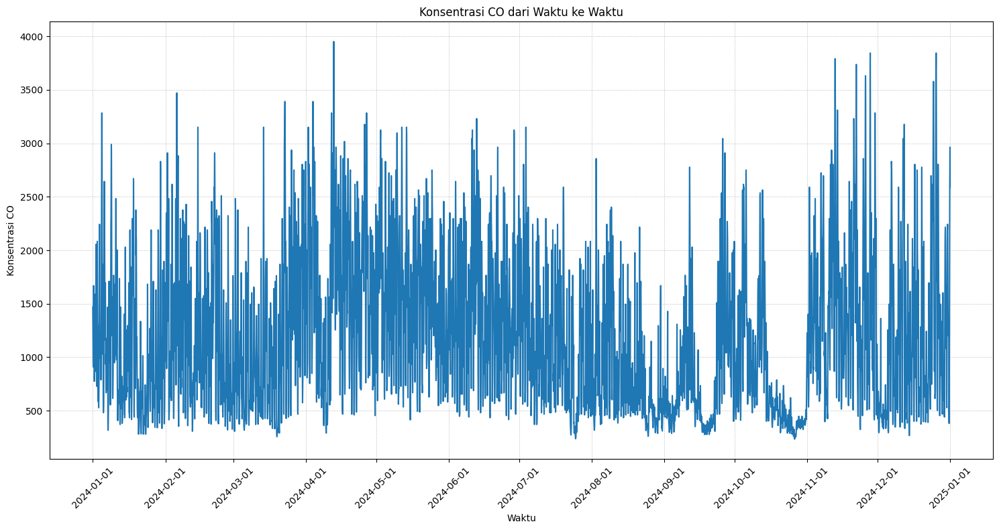

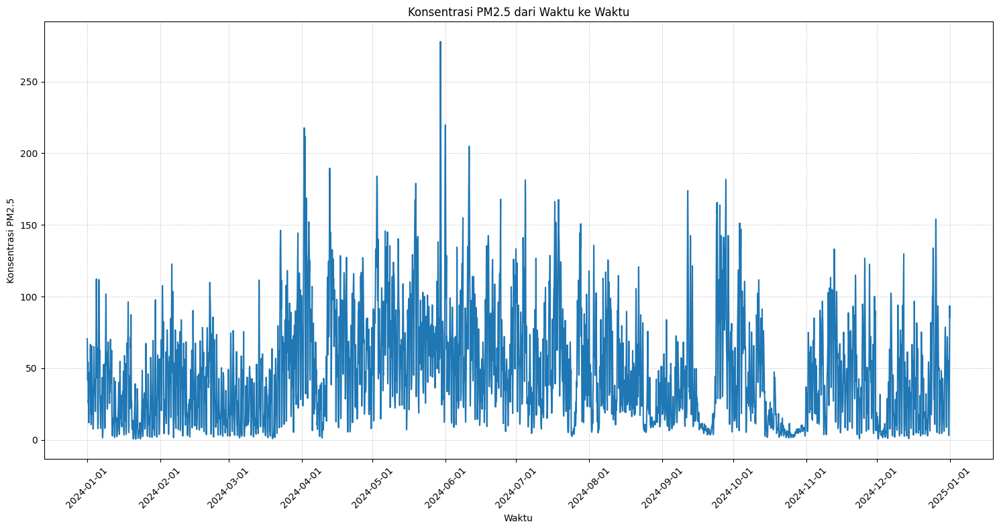

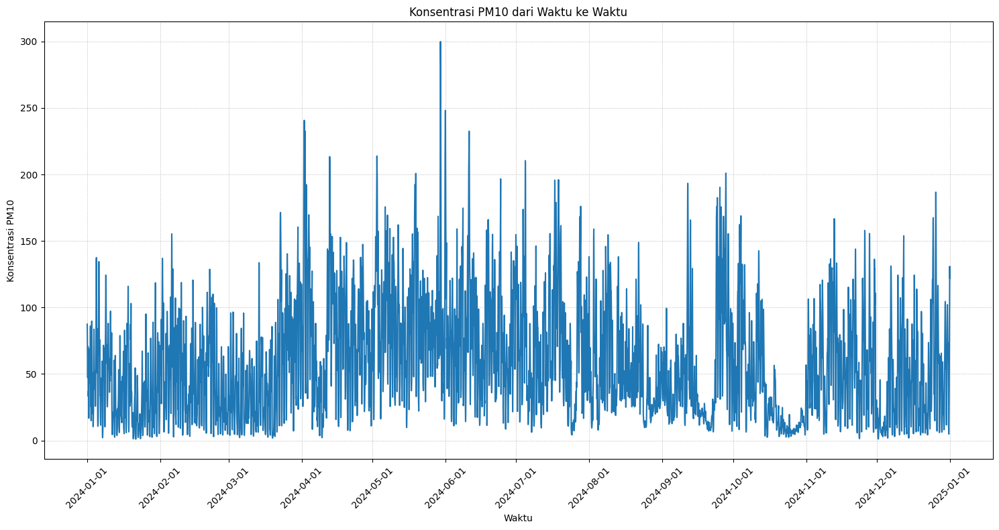

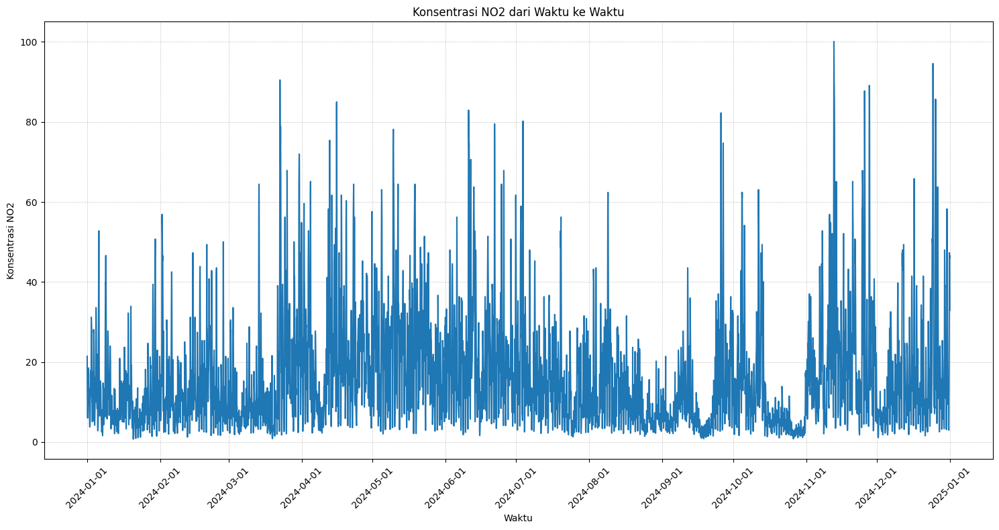

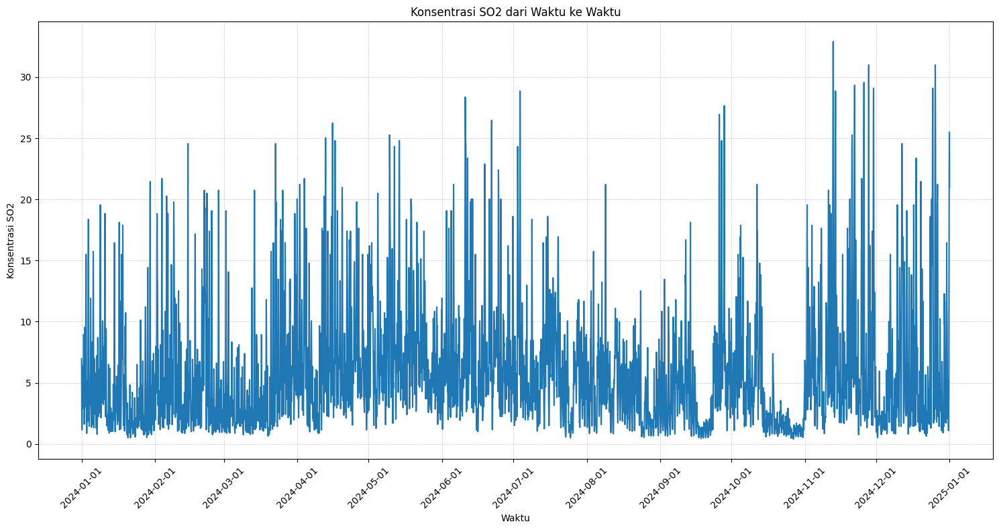

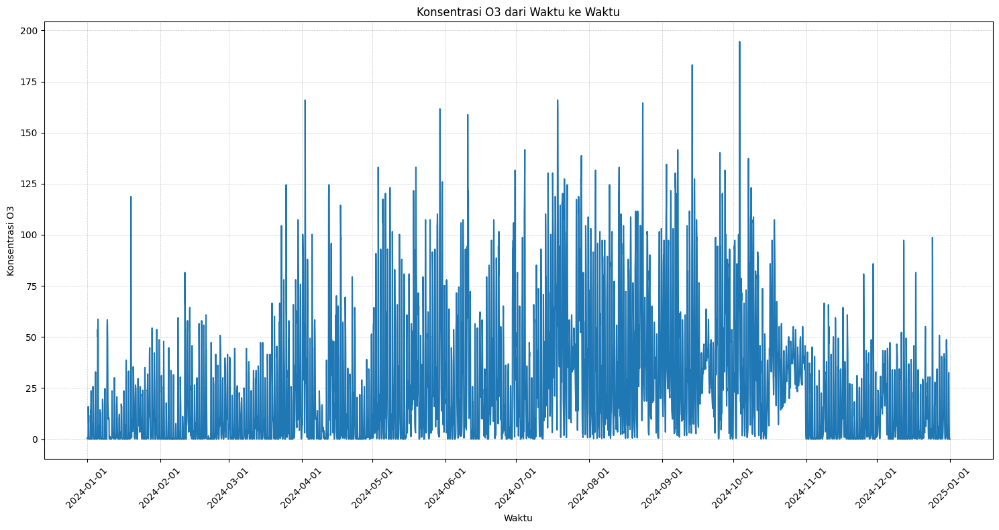

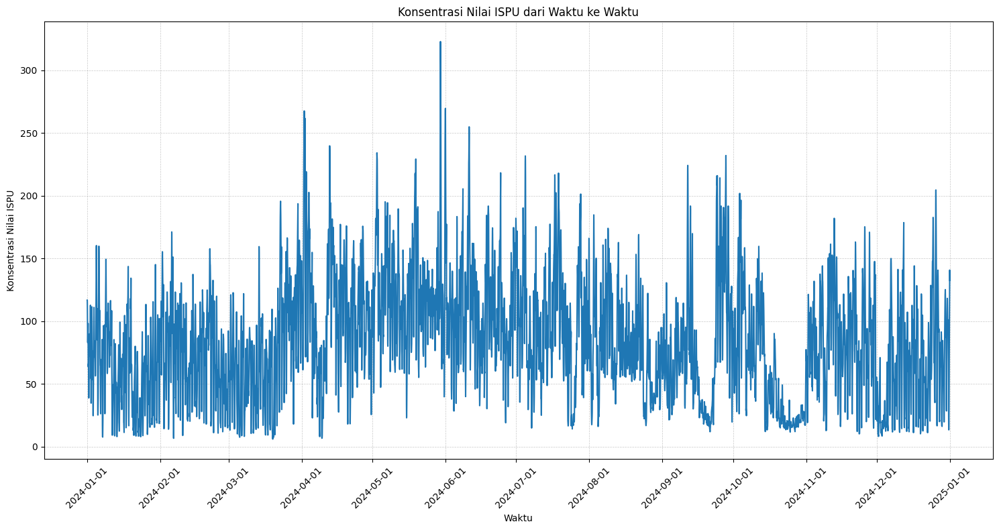

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Pastikan kolom Waktu dalam format datetime
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan semua kolom pencemar udara (selain waktu dan ISPU jika ada)
columns_to_plot = ['CO', 'PM2.5', 'PM10', 'NO2', 'SO2', 'O3', 'Nilai ISPU']

# Loop untuk plot setiap kolom
for col in columns_to_plot:
    plt.figure(figsize=(15, 8))
    plt.plot(df['Waktu'], df[col], label=col)

    # Format sumbu x untuk menampilkan tahun-bulan-tanggal
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.xticks(rotation=45)

    # Set label dan judul
    plt.xlabel('Waktu')
    plt.ylabel(f'Konsentrasi {col}')
    plt.title(f'Konsentrasi {col} dari Waktu ke Waktu')

    # Tambahkan garis grid XY
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    #plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
df.columns

Index(['Waktu', 'PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3', 'Nilai ISPU',
       'Kategori'],
      dtype='object')

In [ ]:
# Melihat nilai unik dan total masing-masing
unique_values = df['Kategori'].value_counts()
print(f"Jumlah nilai unik di kolom 'Kategori': {unique_values}")

Jumlah nilai unik di kolom 'Kategori': Kategori
Sedang                3819
Tidak Sehat           2799
Baik                  2054
Sangat Tidak Sehat     108
Berbahaya                4
Name: count, dtype: int64


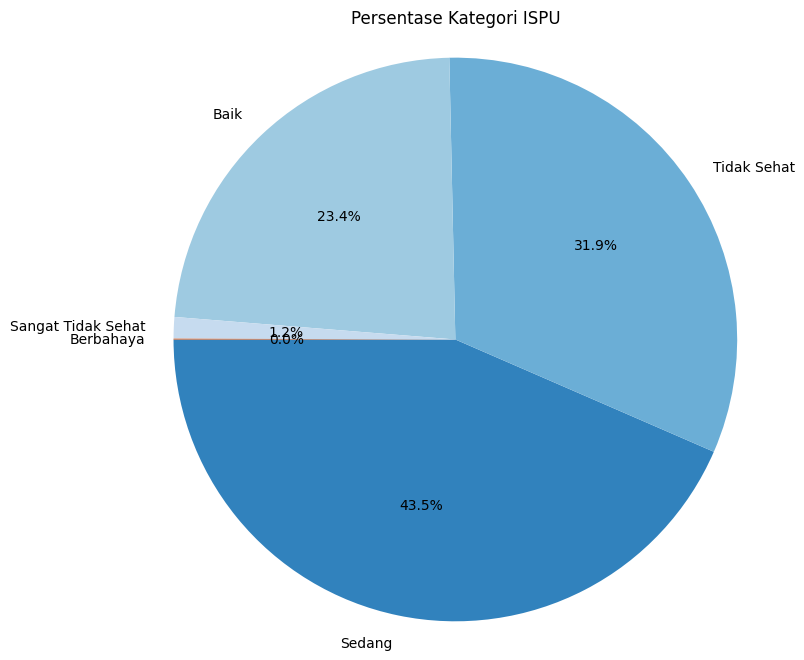

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Misalkan kolom kategori adalah 'Kategori'
# Menghitung distribusi kategori
kategori_counts = df['Kategori'].value_counts()

# Menentukan sudut start angle, misalnya 90 derajat
start_angle = 180  # Anda bisa mengganti nilai ini untuk menyesuaikan

# Membuat pie chart
plt.figure(figsize=(8, 8))
plt.pie(kategori_counts, labels=kategori_counts.index, autopct='%1.1f%%', startangle=start_angle, colors=sns.color_palette('tab20c', len(kategori_counts)))
plt.title('Persentase Kategori ISPU')
plt.axis('equal')  # Menjaga agar pie chart berbentuk bulat
plt.show()


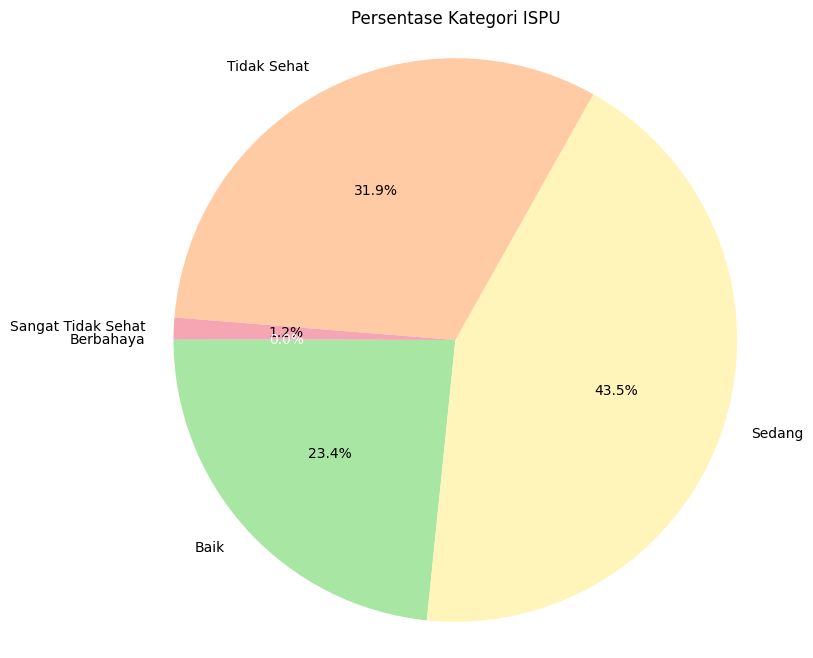

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Misalnya kolom kategori bernama 'Kategori'
kategori_counts = df['Kategori'].value_counts()

# Urutkan agar warnanya konsisten sesuai urutan kategori ISPU
ordered_labels = ['Baik', 'Sedang', 'Tidak Sehat', 'Sangat Tidak Sehat', 'Berbahaya']
kategori_counts = kategori_counts.reindex([k for k in ordered_labels if k in kategori_counts.index])

# Warna pastel sesuai kategori ISPU
pastel_colors = {
    'Baik': '#a8e6a3',             # pastel green
    'Sedang': '#fff5ba',           # pastel yellow
    'Tidak Sehat': '#ffcba4',      # pastel orange
    'Sangat Tidak Sehat': '#f6a6b2',# pastel red
    'Berbahaya': '#c0c0c0'         # light gray instead of pure black
}

# Ambil warna berdasarkan kategori yang ada di pie
colors = [pastel_colors[kat] for kat in kategori_counts.index]

# Plot pie chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    kategori_counts,
    labels=kategori_counts.index,
    autopct='%1.1f%%',
    startangle=180,
    colors=colors,
    textprops={'color': 'black'}  # pastikan semua teks jelas
)

# Untuk segmen "Berbahaya", ubah teks persennya jadi putih agar kontras
for i, label in enumerate(kategori_counts.index):
    if label == 'Berbahaya':
        autotexts[i].set_color('white')

plt.title('Persentase Kategori ISPU')
plt.axis('equal')
plt.show()


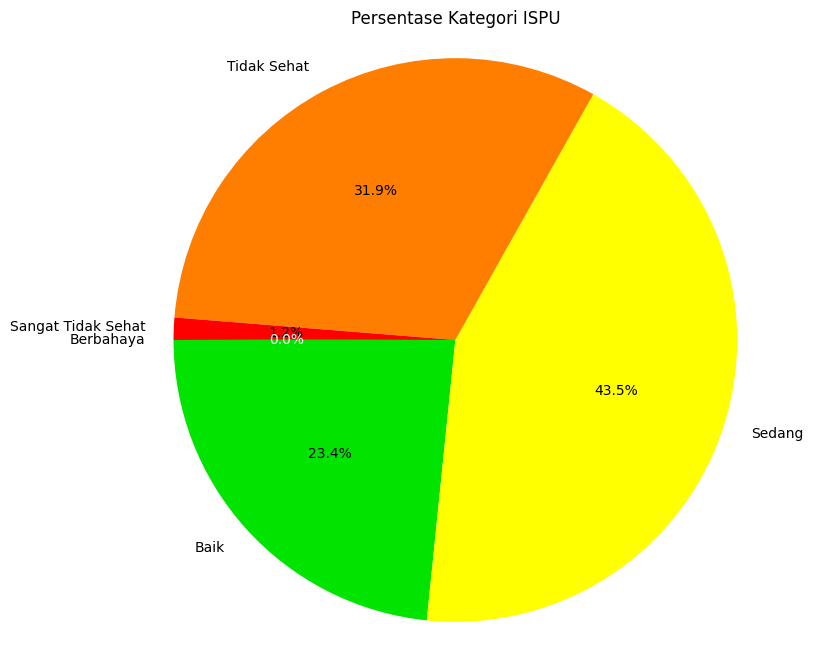

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Misalnya kolom kategori bernama 'Kategori'
kategori_counts = df['Kategori'].value_counts()

# Urutkan agar warnanya konsisten sesuai urutan kategori ISPU
ordered_labels = ['Baik', 'Sedang', 'Tidak Sehat', 'Sangat Tidak Sehat', 'Berbahaya']
kategori_counts = kategori_counts.reindex([k for k in ordered_labels if k in kategori_counts.index])

# Warna ISPU standar (lebih tegas, tidak pastel)
ispu_colors = {
    'Baik': '#00e400',         # Hijau
    'Sedang': '#ffff00',       # Kuning
    'Tidak Sehat': '#ff7e00',  # Oranye
    'Sangat Tidak Sehat': '#ff0000', # Merah
    'Berbahaya': '#7e0023'     # Hitam keunguan gelap
}

# Ambil warna berdasarkan kategori yang ada di pie
colors = [ispu_colors[kat] for kat in kategori_counts.index]

# Plot pie chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    kategori_counts,
    labels=kategori_counts.index,
    autopct='%1.1f%%',
    startangle=180,
    colors=colors,
    textprops={'color': 'black'}
)

# Bikin teks persentase pada warna gelap (misal 'Berbahaya') jadi putih
for i, label in enumerate(kategori_counts.index):
    if label == 'Berbahaya' or ispu_colors[label] == '#7e0023':
        autotexts[i].set_color('white')

plt.title('Persentase Kategori ISPU')
plt.axis('equal')
plt.show()


In [ ]:
# Replace 'Kategori_Anda' with the actual category you want to display
kategorii = 'Berbahaya'
filtered_df = df[df['Kategori'] == kategorii]

# Display the filtered DataFrame
filtered_df


,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,Nilai ISPU,Kategori
3596,2024-05-29 20:00:00,287.51,268.03,2456.67,25.36,9.89,78.68,315.055970,Berbahaya
3597,2024-05-29 21:00:00,299.88,277.90,2429.96,22.28,9.54,72.24,322.925080,Berbahaya
3598,2024-05-29 22:00:00,291.56,268.01,2243.04,20.05,9.66,69.38,315.040024,Berbahaya
3599,2024-05-29 23:00:00,278.40,254.44,2056.12,19.54,9.42,64.37,304.220994,Berbahaya


In [ ]:
df.to_csv('05-data_ISPU_2024.csv', index=False)

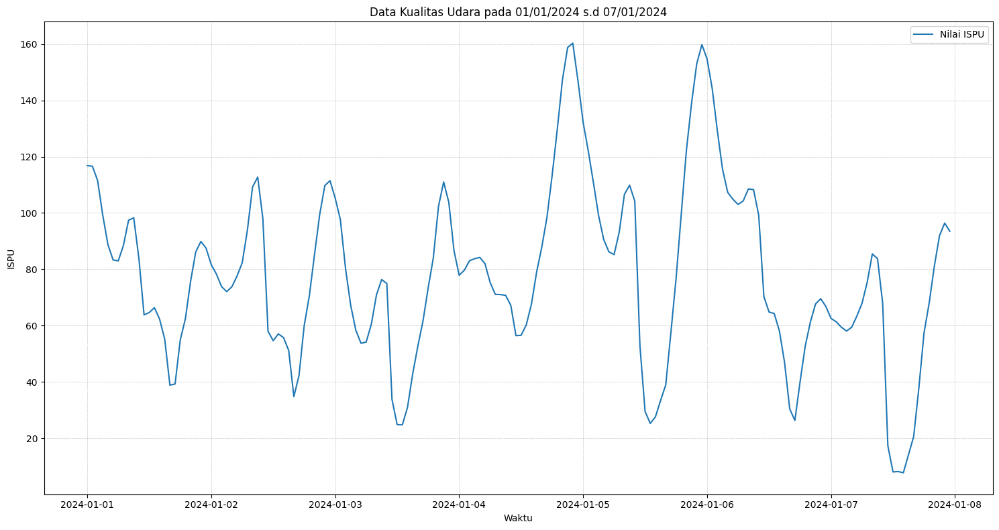

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Konversi kolom Waktu menjadi datetime jika belum
df['Waktu'] = pd.to_datetime(df['Waktu'])

# Tentukan rentang waktu yang diinginkan
start_time = '2024-01-1 00:00:00'
end_time = '2024-01-7 23:00:00'

# Filter data berdasarkan rentang waktu
df_filtered = df[(df['Waktu'] >= start_time) & (df['Waktu'] <= end_time)]

# Tentukan kolom yang ingin diplot
columns_to_plot = ['Nilai ISPU']

# Plot data
plt.figure(figsize=(15, 8))

for col in columns_to_plot:
    plt.plot(df_filtered['Waktu'], df_filtered[col], label=col)

# Tambahkan grid (kotak-kotak latar)
plt.grid(True, linestyle='--', alpha=0.6)

# Set labels dan title
plt.xlabel('Waktu')
plt.ylabel('ISPU')
plt.title('Data Kualitas Udara pada 01/01/2024 s.d 07/01/2024')
plt.legend(loc='upper right')

# Tambahkan garis grid XY
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Tampilkan plot
plt.tight_layout()
plt.show()


#### data clean

In [ ]:
import pandas as pd


df = pd.read_csv('/kaggle/working/05-data_ISPU_2024.csv')
df.head()

,Waktu,PM10,PM2.5,CO,NO2,SO2,O3,Nilai ISPU,Kategori
0,2024-01-01 00:00:00,87.39,70.58,1468.66,21.42,6.97,0.30,116.819158,Tidak Sehat
1,2024-01-01 01:00:00,85.55,70.38,1375.20,15.59,4.53,0.12,116.610737,Tidak Sehat
2,2024-01-01 02:00:00,77.89,65.52,1214.98,9.94,2.12,0.36,111.546105,Tidak Sehat
3,2024-01-01 03:00:00,63.27,54.75,1054.76,7.37,1.33,0.65,99.201754,Sedang
4,2024-01-01 04:00:00,52.20,46.25,947.95,6.25,1.16,0.73,88.763158,Sedang


In [ ]:
datas = df.drop(columns=['Waktu','Kategori'])
datas.head()

,PM10,PM2.5,CO,NO2,SO2,O3,Nilai ISPU
0,87.39,70.58,1468.66,21.42,6.97,0.30,116.819158
1,85.55,70.38,1375.20,15.59,4.53,0.12,116.610737
2,77.89,65.52,1214.98,9.94,2.12,0.36,111.546105
3,63.27,54.75,1054.76,7.37,1.33,0.65,99.201754
4,52.20,46.25,947.95,6.25,1.16,0.73,88.763158


In [ ]:
datas.describe()

,PM10,PM2.5,CO,NO2,SO2,O3,Nilai ISPU
count,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,57.045741,45.976274,1179.376776,15.783973,5.773337,25.011085,83.287904
std,41.910577,36.519140,696.222895,13.883108,4.896158,30.085011,45.711458
min,1.020000,0.590000,233.650000,0.730000,0.400000,0.000000,6.033333
25%,23.205000,16.717500,594.140000,6.000000,2.210000,1.080000,52.495175
50%,48.105000,37.900000,1014.710000,11.140000,4.410000,13.590000,78.508772
75%,82.112500,66.335000,1628.880000,21.420000,7.510000,38.270000,112.395421
max,299.880000,277.900000,3952.030000,100.080000,32.900000,194.550000,322.925080


In [ ]:
datas.to_csv('06-data_fix_2024.csv', index=False)

# Model hyperFix

## yg terbaru norm

2025-07-16 08:59:23.307005: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752656363.659092      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752656363.761681      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



 Grafik Pembagian Data 


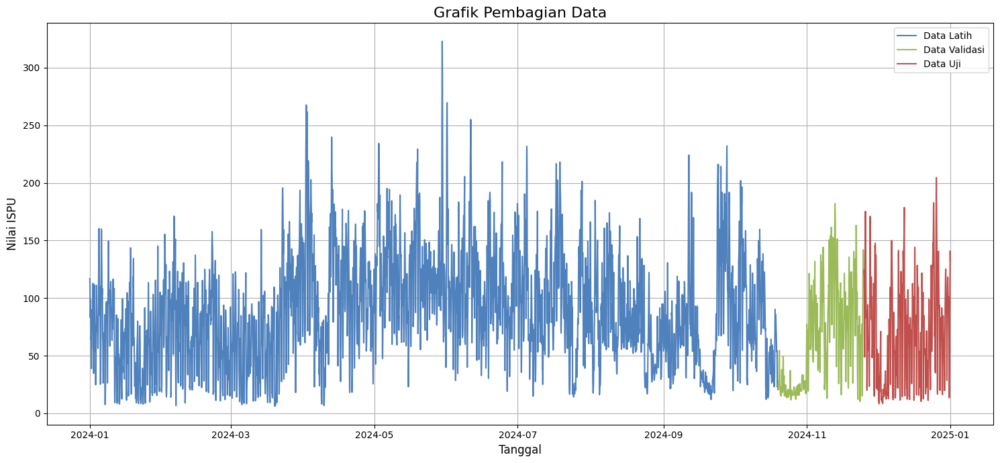


 Data Setelah Normalisasi

Contoh Data Latih Setelah Normalisasi (Fitur Input):
       PM10     PM2.5        CO       NO2       SO2        O3  Nilai ISPU
0  0.288998  0.252389  0.331536  0.230529  0.229577  0.001542    0.349601
1  0.282841  0.251668  0.306379  0.165571  0.143662  0.000617    0.348944
2  0.257211  0.234142  0.263252  0.102618  0.058803  0.001850    0.332962
3  0.208292  0.195305  0.220124  0.073983  0.030986  0.003341    0.294007
4  0.171251  0.164653  0.191373  0.061504  0.025000  0.003752    0.261067

Contoh Data Latih Target Setelah Normalisasi (Semua Fitur Target):
       PM10     PM2.5        CO       NO2       SO2        O3  Nilai ISPU
0  0.288998  0.252389  0.331536  0.230529  0.229577  0.001542    0.349601
1  0.282841  0.251668  0.306379  0.165571  0.143662  0.000617    0.348944
2  0.257211  0.234142  0.263252  0.102618  0.058803  0.001850    0.332962
3  0.208292  0.195305  0.220124  0.073983  0.030986  0.003341    0.294007
4  0.171251  0.164653  0.191373  0.06

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K
from tensorflow.keras.losses import MeanSquaredError
from math import sqrt
import os

# ==== Custom Metric ====
# This definition is crucial for both training and loading the model
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# ==== Load & Preprocess Data ====
data = pd.read_csv('/kaggle/input/datasetwib/05-data_ISPU_2024.csv')
data['Waktu'] = pd.to_datetime(data['Waktu'])
data = data.drop(columns=['Kategori'])

# Define ALL columns as target columns for prediction (assuming all except 'Waktu' are targets)
# For 7 inputs and 7 outputs, the target columns are the same as input features
target_columns = data.drop(columns=['Waktu']).columns.tolist()

# Ensure all target columns exist in the dataframe
for col in target_columns:
    if col not in data.columns:
        raise ValueError(f"Target column '{col}' not found in the dataset. Please check the column names.")

timestamps = data['Waktu'].values
# Separate input features and the target features
# When inputs = outputs, input_features_df and target_feature_df will be the same
input_features_df = data.drop(columns=['Waktu'])
target_feature_df = data.drop(columns=['Waktu']) # Target is now all 7 features

input_values = input_features_df.values
target_values = target_feature_df.values
feature_names = input_features_df.columns.tolist() # This is also the target feature names

# ==== Split Data (menggunakan n_train, n_val, n_test seperti yang diminta) ====
n_total = len(data) # Menggunakan panjang data asli untuk pembagian
n_train = int(n_total * 0.80)
n_val = int(n_total * 0.10)
n_test = n_total - n_train - n_val # Sisa data untuk test

# Splitting input features
train_input_data = input_values[:n_train]
val_input_data = input_values[n_train : n_train + n_val]
test_input_data = input_values[n_train + n_val : ]

# Splitting target features
train_target_data = target_values[:n_train]
val_target_data = target_values[n_train : n_train + n_val]
test_target_data = target_values[n_train + n_val : ]

train_time = timestamps[:n_train]
val_time = timestamps[n_train : n_train + n_val]
test_time = timestamps[n_train + n_val : ]

# ==== Plot Data Division ====
print("\n Grafik Pembagian Data ")
plt.figure(figsize=(15, 7))
plt.plot(data['Waktu'].iloc[:n_train], data['Nilai ISPU'].iloc[:n_train], '#4F81BD', label='Data Latih')
# Untuk set validasi dan uji, plot dari titik terakhir set sebelumnya untuk memastikan kontinuitas
plt.plot(data['Waktu'].iloc[n_train-1 : n_train + n_val], data['Nilai ISPU'].iloc[n_train-1 : n_train + n_val], '#9BBB59', label='Data Validasi')
plt.plot(data['Waktu'].iloc[n_train + n_val - 1 : ], data['Nilai ISPU'].iloc[n_train + n_val - 1 : ], '#C0504D', label='Data Uji')

plt.title('Grafik Pembagian Data', fontsize=16)
plt.xlabel('Tanggal', fontsize=12)
plt.ylabel('Nilai ISPU', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("\n Data Setelah Normalisasi")

# ==== Normalisasi (using separate scalers for input features and target features) ====
scaler_features = MinMaxScaler() # For input features
scaler_target = MinMaxScaler()   # For target features

# Fit and transform training data
X_train_scaled = scaler_features.fit_transform(train_input_data)
y_train_scaled = scaler_target.fit_transform(train_target_data)

# Transform validation data
X_val_scaled = scaler_features.transform(val_input_data)
y_val_scaled = scaler_target.transform(val_target_data)

# Transform test data
X_test_scaled = scaler_features.transform(test_input_data)
y_test_scaled = scaler_target.transform(test_target_data)



# Optional: Create DataFrames for scaled data (for inspection)
train_scaled_df = pd.DataFrame(X_train_scaled, columns=feature_names)
# For multi-target, we can't just add 'Nilai ISPU Normalisasi' as a single column.
# If you want to see the scaled target values, you'd inspect y_train_scaled directly.
print("\nContoh Data Latih Setelah Normalisasi (Fitur Input):")
print(train_scaled_df.head())
print("\nContoh Data Latih Target Setelah Normalisasi (Semua Fitur Target):")
print(pd.DataFrame(y_train_scaled, columns=target_columns).head())



Training Model GRU 1 (LB=12, GRU=[128, 64, 32], Batch=16, LR=0.001)


I0000 00:00:1752656437.421323      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752656437.422013      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1752656443.341865     103 cuda_dnn.cc:529] Loaded cuDNN version 90300



Per-Epoch MSE & RMSE for Model GRU 1 (LB=12, GRU=[128, 64, 32], Batch=16, LR=0.001)
Epoch |  Train MSE   |   Val MSE    |  Train RMSE  |   Val RMSE  
-------------------------------------------------------------
    1 |       0.0057 |       0.0015 |       0.0684 |       0.0354
    2 |       0.0019 |       0.0010 |       0.0423 |       0.0302
    3 |       0.0016 |       0.0009 |       0.0383 |       0.0271
    4 |       0.0014 |       0.0008 |       0.0353 |       0.0263
    5 |       0.0012 |       0.0008 |       0.0336 |       0.0263
    6 |       0.0011 |       0.0008 |       0.0323 |       0.0249
    7 |       0.0010 |       0.0007 |       0.0311 |       0.0242
    8 |       0.0010 |       0.0007 |       0.0300 |       0.0235
    9 |       0.0009 |       0.0006 |       0.0293 |       0.0230
   10 |       0.0009 |       0.0006 |       0.0285 |       0.0220
   11 |       0.0008 |       0.0006 |       0.0280 |       0.0219
   12 |       0.0008 |       0.0007 |       0.0273 |       0.

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_24 (GRU)                         │ (None, 24, 128)             │          52,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_25 (GRU)                         │ (None, 24, 64)              │          37,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_26 (GRU)                         │ (None, 32)                  │           9,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 99,497 (388.66 KB)

 Trainable params: 99,495 (388.65 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)


--- Detailed Weights and Biases for Each Layer ---

  LAYER 1: GRU_24 (Type: GRU)
  > Kernel Weights (Input to Gates) (Shape: (7, 384)):
    Sub-matrix (first 7x50):
[[-0.4052, -0.1729, -0.213 ,  0.0453, -0.3292, -0.0899, -0.1206, -0.2198,
  -0.2488, -0.3922, -0.2527,  0.0545, -0.006 , -0.0405,  0.065 , -0.0469,
  -0.6084, -0.2539, -0.2173, -0.198 , -0.14  , -0.5475, -0.2816, -0.0244,
  -0.0784, -0.3364,  0.1659, -0.2158, -0.4486, -0.2611, -0.0241, -0.2181,
  -0.257 , -0.0546,  0.2854,  0.3176, -0.0314, -0.2192, -0.5119, -0.3912,
  -0.2067, -0.4876, -0.4329, -0.4138, -0.0281, -0.4813, -0.2803,  0.0141,
  -0.3843, -0.2569],
 [-0.3532, -0.3461, -0.1359, -0.1266, -0.2278,  0.051 , -0.1479, -0.1603,
  -0.275 , -0.3912, -0.0537, -0.0652,  0.1986,  0.0615,  0.0792, -0.0087,
  -0.5155, -0.3126, -0.4764, -0.2547,  0.0163, -0.5164, -0.2258, -0.1123,
  -0.2308, -0.331 ,  0.1402, -0.1194, -0.2888, -0.4904, -0.1278, -0.1228,
  -0.1925, -0.07  ,  0.0934,  0.2384, -0.0373, -0.2059, -0.4819, -0.3006

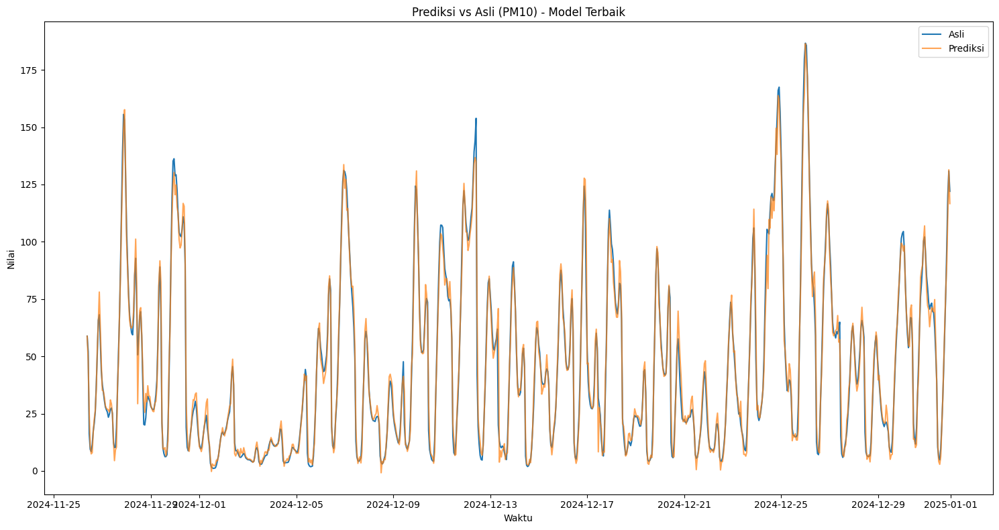

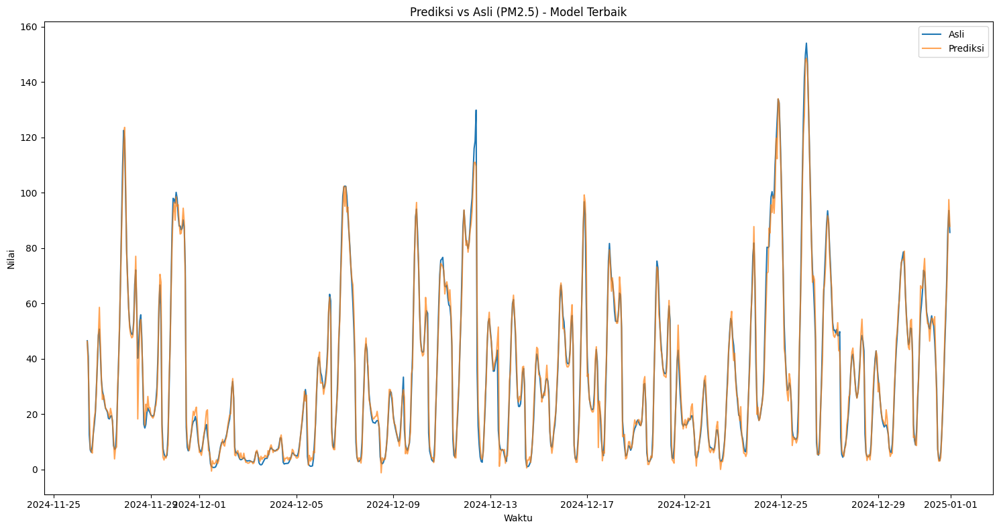

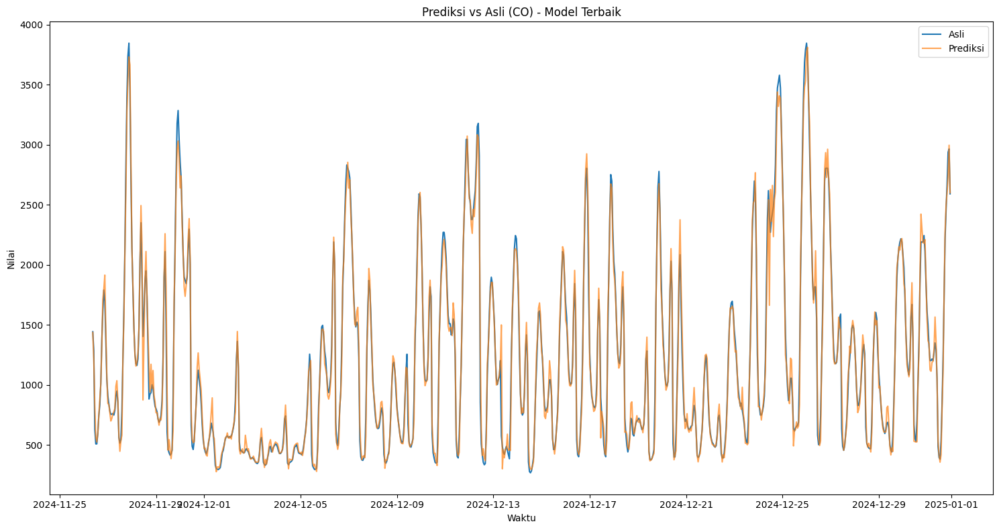

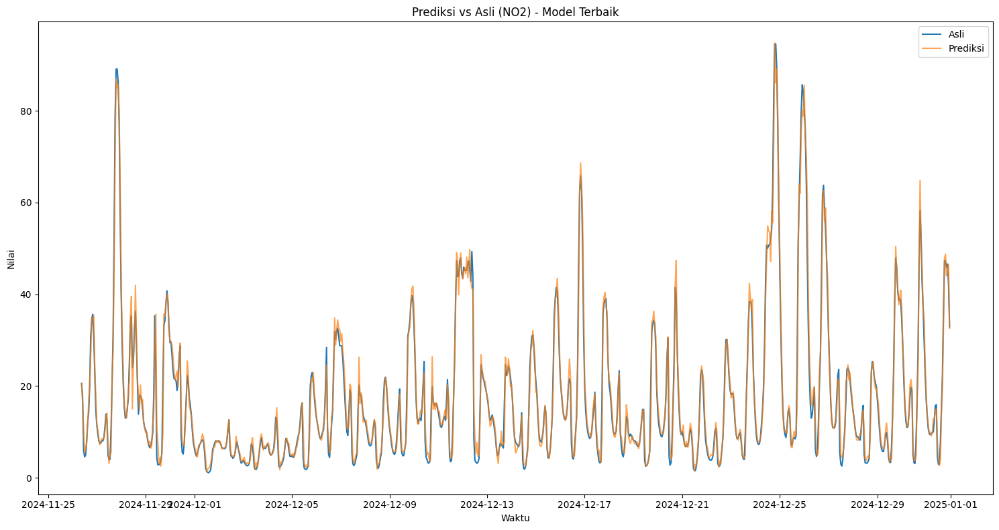

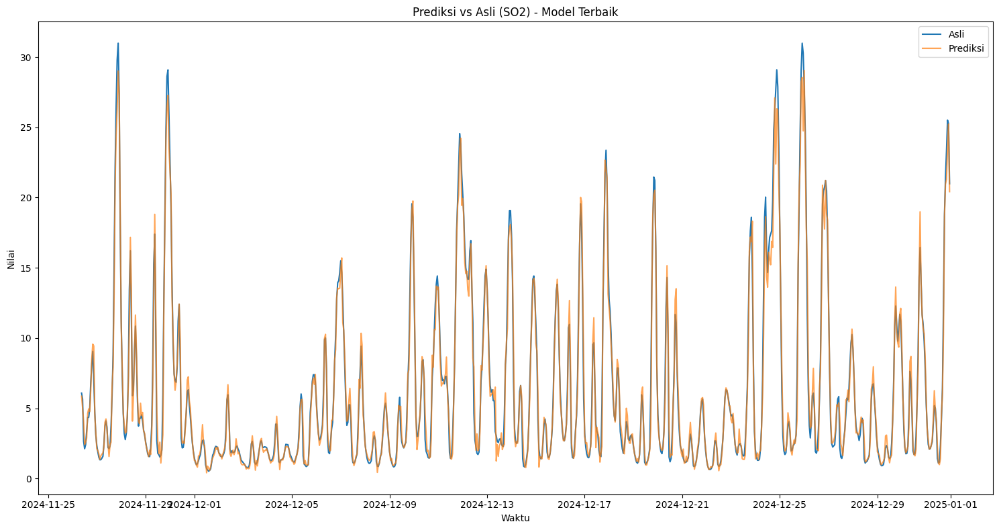

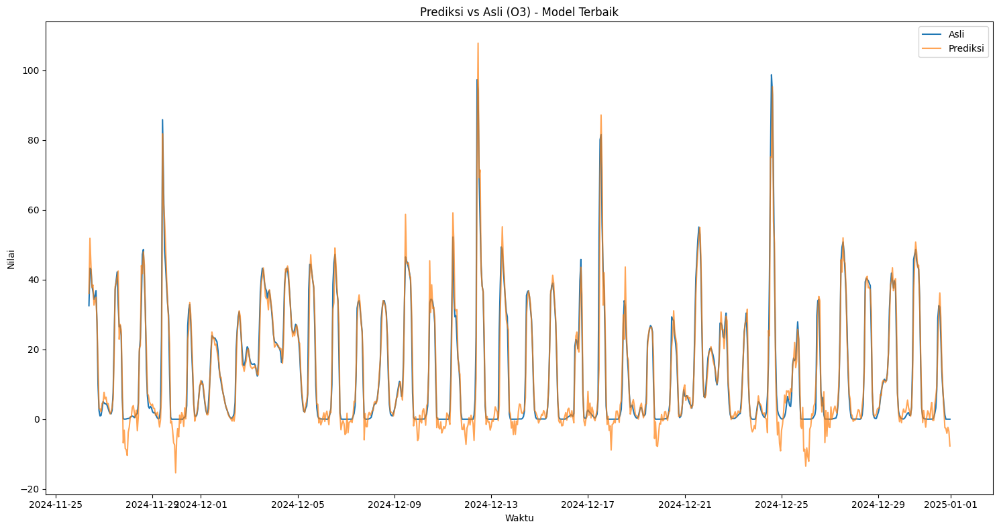

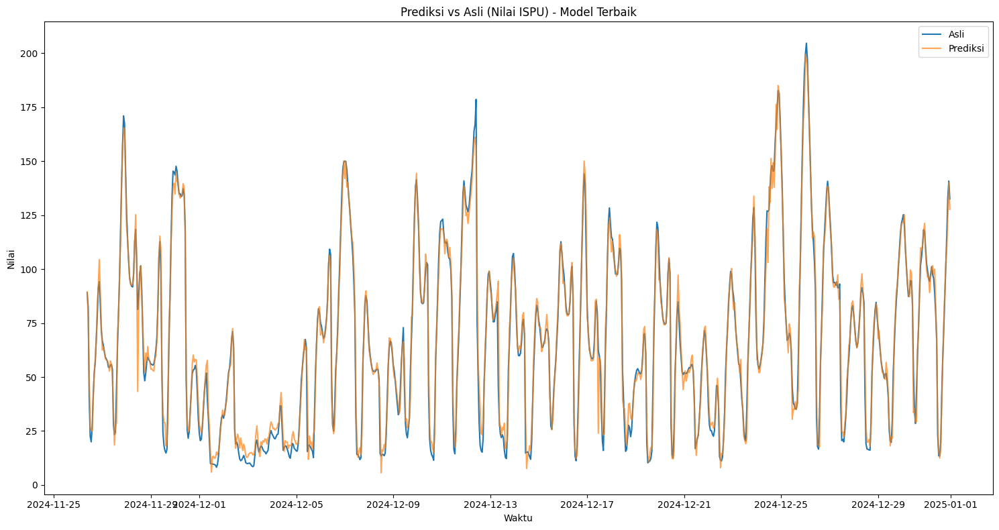

In [ ]:
3# ==== Sequence Maker ====
def create_sequences(input_data, target_data, lookback):
    """
    Creates sequences for time series prediction.
    X contains the input features for 'lookback' steps.
    y contains ALL target features at the next step.
    """
    X, y = [], []
    for i in range(len(input_data) - lookback):
        X.append(input_data[i:i + lookback])
        y.append(target_data[i + lookback]) # y now appends all target features
    return np.array(X), np.array(y)

# ==== Hyperparameters ====
lookbacks = [12, 24]
batch_sizes = [16, 32, 64]
learning_rates = [0.001, 0.0001]
fixed_gru_architecture = [128, 64, 32] # Hidden units for GRU layers (keeping your previous values)
epochs = 200

results = []                         # menyimpan ringkasan metrik dari SEMUA model yang dilatih.
all_histories = {}                   # menyimpan history (loss, rmse, dll per epoch) dari SEMUA model.

best_overall_val_rmse = float('inf') # nyari model terbaik berdasarkan Val RMSE terkecil.
best_model = None                    # menyimpan model GRU terbaik (model Keras) berdasarkan val RMSE terkecil.
best_model_config = {}               # menyimpan konfigurasi model terbaik aja, seperti: lb, bs, lr
best_model_test_pred_orig = None     # menyimpan prediksi hasil model terbaik pada data test, dalam bentuk nilai asli (sudah inverse transform).
best_model_y_test_orig = None        # menyimpan nilai asli ground truth (y_test), juga sudah inverse transform.
best_model_lookback = None           # Menyimpan berapa lookback yang digunakan oleh model terbaik

# ==== Training Loop ====
model_counter = 0
for lookback in lookbacks:
    # Create sequences using the scaled input and target data
    X_train, y_train = create_sequences(X_train_scaled, y_train_scaled, lookback)
    X_val, y_val = create_sequences(X_val_scaled, y_val_scaled, lookback)

    for batch_size in batch_sizes:
        for lr in learning_rates:
            model_counter += 1
            model_name = f"Model GRU {model_counter} (LB={lookback}, GRU={fixed_gru_architecture}, Batch={batch_size}, LR={lr})"
            print(f'\nTraining {model_name}')

            model = Sequential()
            # Input shape: (lookback, number_of_input_features)
            model.add(Input(shape=(lookback, X_train.shape[2])))
            model.add(GRU(fixed_gru_architecture[0], return_sequences=True)) # First GRU layer
            model.add(GRU(fixed_gru_architecture[1], return_sequences=True))  # Second GRU layer
            model.add(GRU(fixed_gru_architecture[2]))                          # Third GRU layer (no return sequences)
            model.add(Dense(len(target_columns))) # Output Dense layer now predicts ALL target_columns

            model.compile(optimizer=Adam(learning_rate=lr),
                          loss='mse',
                          metrics=['mse', root_mean_squared_error])

            early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

            history = model.fit(X_train, y_train,
                                validation_data=(X_val, y_val), # validation digunakan di sini
                                epochs=epochs,
                                batch_size=batch_size,
                                callbacks=[early_stop],
                                verbose=0) # Set verbose to 0 to suppress per-epoch output during training

            all_histories[model_name] = history.history
            best_epoch_idx = np.argmin(history.history['val_root_mean_squared_error'])
            all_histories[model_name]['best_epoch_idx'] = best_epoch_idx
            all_histories[model_name]['best_val_rmse_keras_metric'] = history.history['val_root_mean_squared_error'][best_epoch_idx]
            all_histories[model_name]['best_val_mse_at_best_rmse_epoch'] = history.history['val_mse'][best_epoch_idx]

            print(f"\nPer-Epoch MSE & RMSE for {model_name}")
            print(f"{'Epoch':^5} | {'Train MSE':^12} | {'Val MSE':^12} | {'Train RMSE':^12} | {'Val RMSE':^12}")
            print("-" * 61)
            for epoch_num, (mse, val_mse, rmse, val_rmse) in enumerate(zip(
                history.history['mse'],
                history.history['val_mse'],
                history.history['root_mean_squared_error'],
                history.history['val_root_mean_squared_error']
            ), 1):
                print(f"{epoch_num:5d} | {mse:12.4f} | {val_mse:12.4f} | {rmse:12.4f} | {val_rmse:12.4f}")

            best_epoch = best_epoch_idx + 1
            best_val_rmse_keras_metric = history.history['val_root_mean_squared_error'][best_epoch_idx]
            print(f"\nEpoch Terbaik: {best_epoch} (Val RMSE: {best_val_rmse_keras_metric:.4f})")

            # Create test sequences for evaluation
            X_test, y_test = create_sequences(X_test_scaled, y_test_scaled, lookback)

            # Make predictions on scaled data
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
            y_test_pred = model.predict(X_test)

            # Inverse transform actual and predicted values using the target_scaler
            y_train_orig = scaler_target.inverse_transform(y_train)
            y_val_orig = scaler_target.inverse_transform(y_val)
            y_test_orig = scaler_target.inverse_transform(y_test)

            y_train_pred_orig = scaler_target.inverse_transform(y_train_pred)
            y_val_pred_orig = scaler_target.inverse_transform(y_val_pred)
            y_test_pred_orig = scaler_target.inverse_transform(y_test_pred)

            # Calculate overall RMSE and MSE (these are now for ALL target features)
            train_rmse = sqrt(mean_squared_error(y_train_orig, y_train_pred_orig))
            val_rmse = sqrt(mean_squared_error(y_val_orig, y_val_pred_orig))
            test_rmse = sqrt(mean_squared_error(y_test_orig, y_test_pred_orig))

            train_mse = mean_squared_error(y_train_orig, y_train_pred_orig)
            val_mse = mean_squared_error(y_val_orig, y_val_pred_orig)
            test_mse = mean_squared_error(y_test_orig, y_test_pred_orig)

            print(f"\nFinal Metrics:")
            print(f"Train MSE:    {train_mse:.4f} | Train RMSE: {train_rmse:.4f}")
            print(f"Val    MSE:    {val_mse:.4f} | Val    RMSE: {val_rmse:.4f}")
            print(f"Test   MSE:    {test_mse:.4f} | Test   RMSE: {test_rmse:.4f}")

            results.append({
                'Model': model_name,
                'Lookback': lookback,
                'GRU Layers': fixed_gru_architecture,
                'Batch Size': batch_size,
                'Learning Rate': lr,
                'Train RMSE': train_rmse,
                'Val RMSE': val_rmse,
                'Test RMSE': test_rmse,
                'Train MSE': train_mse,
                'Val MSE': val_mse,
                'Test MSE': test_mse,
                'Best Epoch': best_epoch
            })

            # Check if current model is the best based on validation RMSE
            if val_rmse < best_overall_val_rmse:
                best_overall_val_rmse = val_rmse
                best_model = model
                best_model_config = {
                    'Lookback': lookback,
                    'GRU Layers': fixed_gru_architecture,
                    'Batch Size': batch_size,
                    'Learning Rate': lr,
                    'Best Epoch': best_epoch,
                    'Val RMSE': val_rmse,
                    'Val MSE': val_mse,
                    'Target Features': target_columns # Now includes all target features
                }
                best_model_test_pred_orig = y_test_pred_orig
                best_model_y_test_orig = y_test_orig
                best_model_lookback = lookback

# ---
## Save Metrics Results
#---
results_df = pd.DataFrame(results).sort_values(by='Val RMSE')
results_df.to_csv('hasil_gru3layer_multi_target_pat10.csv', index=False)
print("\nHasil metrik semua model disimpan di 'hasil_gru3layer_multi_target_pat10.csv'")

# ---
## Visualize Loss Curves (MSE and RMSE)
#---
print("\nMenghasilkan visualisasi kurva loss untuk semua model...")
output_loss_folder = 'loss_plots_multi_target_pat10'
os.makedirs(output_loss_folder, exist_ok=True)

for model_name, hist_data in all_histories.items():
    # --- Plot MSE Loss Curve ---
    plt.figure(figsize=(15, 8))
    plt.plot(hist_data['loss'], label='Train Loss (MSE)')
    plt.plot(hist_data['val_loss'], label='Val Loss (MSE)')

    best_epoch_idx = hist_data['best_epoch_idx']
    best_val_mse_at_best_rmse_epoch = hist_data['best_val_mse_at_best_rmse_epoch']

    plt.scatter(best_epoch_idx, hist_data['val_loss'][best_epoch_idx], color='red', s=50, zorder=5,
                label=f'Best Val Epoch: {best_epoch_idx + 1} (Val MSE: {best_val_mse_at_best_rmse_epoch:.4f})')

    plt.title(f'Loss (MSE) Curve for {model_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.ylim(0, 0.02) # Adjusted ylim for better visualization of scaled loss
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(os.path.join(output_loss_folder, f'{model_name.replace(" ", "_").replace("(", "").replace(")", "").replace("[", "").replace("]", "").replace(",", "_").replace(" ", "")}_loss_mse_curve.png'))
    plt.close()

print(f"Visualisasi kurva loss MSE disimpan di folder: {output_loss_folder}")

# ---
## Save Best Model
#---
if best_model is not None:
    best_model.save('best_gru_multi_target_model_pat10.h5')
    print("\nModel terbaik disimpan sebagai 'best_gru_multi_target_model_pat10.h5'")
    print("Konfigurasi model terbaik:")
    for k, v in best_model_config.items():
        print(f"{k}: {v}")

    # ---
    ## Visualize Best Model Predictions for each target feature
    # ---
    print(f"\nMenghasilkan visualisasi prediksi model terbaik untuk setiap fitur target di data test...")
    output_pred_folder = 'best_model_predictions_multi_target_pat10'
    os.makedirs(output_pred_folder, exist_ok=True)

    start_index_test = best_model_lookback
    test_time_plot_for_best_model = test_time[start_index_test : start_index_test + len(best_model_y_test_orig)]

    for i, feature_name in enumerate(target_columns):
        plt.figure(figsize=(15, 8))
        plt.plot(test_time_plot_for_best_model, best_model_y_test_orig[:, i], label='Asli')
        plt.plot(test_time_plot_for_best_model, best_model_test_pred_orig[:, i], label='Prediksi', alpha=0.7)
        plt.title(f'Prediksi vs Asli ({feature_name}) - Model Terbaik')
        plt.xlabel('Waktu')
        plt.ylabel('Nilai')
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(output_pred_folder, f'best_model_pred_{feature_name.replace(" ", "_")}.png'))
        #plt.close()
    print(f"Visualisasi prediksi model terbaik disimpan di folder: {output_pred_folder}")

    # ---
    ## Save Test Prediction Results CSV
    #---
    print(f"\nMenyimpan hasil prediksi test dan data asli test model terbaik untuk semua fitur target ke CSV...")
    df_results_multi = pd.DataFrame({'Waktu': test_time_plot_for_best_model})
    for i, feature_name in enumerate(target_columns):
        df_results_multi[f'Asli_{feature_name}'] = best_model_y_test_orig[:, i]
        df_results_multi[f'Prediksi_{feature_name}'] = best_model_test_pred_orig[:, i]
    df_results_multi.to_csv('prediksi_asli_test_model_terbaik_multi_target_pat10.csv', index=False)
    print("File 'prediksi_asli_test_model_terbaik_multi_target_pat10.csv' telah dibuat.")
else:
    print("\nTidak ada model yang terlatih. Pastikan data dan konfigurasi sudah benar.")

print("\n--- Proses Selesai ---")
print("\nHasil Akhir Semua Model:")
print(results_df)

# ====================================================================================================
# START OF: Code to Load Model and Display Weights/Biases
# ====================================================================================================

# --- Configuration for Weights/Biases Display ---
model_path = 'best_gru_multi_target_model_pat10.h5'

# --- Display Weights and Biases ---
print("\n" + "="*70)
print("  DISPLAYING WEIGHTS AND BIASES OF THE BEST GRU MODEL (MULTI TARGET)")
print("  (Showing approximately 50 values per dimension)")
print("="*70)

if os.path.exists(model_path):
    try:
        # It's important to pass custom_objects when loading models that use custom metrics
        loaded_model = load_model(model_path, custom_objects={
            'root_mean_squared_error': root_mean_squared_error,
            'mse': MeanSquaredError() # MSE is not strictly custom, but good practice to include if explicitly used
        })

        print(f"\nSuccessfully loaded the model from: {model_path}")
        print("\n--- Model Summary ---")
        loaded_model.summary()

        print("\n--- Detailed Weights and Biases for Each Layer ---")
        for i, layer in enumerate(loaded_model.layers):
            weights_and_biases = layer.get_weights()

            if weights_and_biases:
                print(f"\n" + "="*50)
                print(f"  LAYER {i+1}: {layer.name.upper()} (Type: {layer.__class__.__name__})")
                print("="*50)

                for j, wb_tensor in enumerate(weights_and_biases):
                    param_type = ""
                    if layer.name.startswith('gru'):
                        if j == 0: param_type = "Kernel Weights (Input to Gates)"
                        elif j == 1: param_type = "Recurrent Kernel Weights (Hidden to Gates)"
                        elif j == 2: param_type = "Bias"
                    elif layer.name.startswith('dense'):
                        if j == 0: param_type = "Weights"
                        elif j == 1: param_type = "Biases"
                    else:
                        param_type = f"Parameter {j}"

                    print(f"  > {param_type} (Shape: {wb_tensor.shape}):")

                    if wb_tensor.ndim == 1:
                        display_len = min(len(wb_tensor), 50)
                        if display_len < len(wb_tensor):
                            print(f"    [ {', '.join(f'{x:.4f}' for x in wb_tensor[:display_len])} ... (truncated) ]")
                        else:
                            print(f"    {wb_tensor}")
                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")

                    elif wb_tensor.ndim == 2:
                        rows_to_display = min(wb_tensor.shape[0], 50)
                        cols_to_display = min(wb_tensor.shape[1], 50)

                        print(f"    Sub-matrix (first {rows_to_display}x{cols_to_display}):")
                        print(np.array2string(wb_tensor[:rows_to_display, :cols_to_display], precision=4, separator=', ', suppress_small=True))

                        if rows_to_display < wb_tensor.shape[0] or cols_to_display < wb_tensor.shape[1]:
                            print("    ... (truncated)")

                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")
                    else:
                        print(f"    {np.array2string(wb_tensor, precision=4, separator=', ', suppress_small=True)}")
                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")
                    print("-" * 50)

            else:
                print(f"\nLayer {i+1}: {layer.name.upper()} (Type: {layer.__class__.__name__}) - Does not have trainable weights.")

    except Exception as e:
        print(f"\nError loading or inspecting the model: {e}")
        print("Please ensure:")
        print(f"1. The model file '{model_path}' exists in the current directory.")
        print("2. The 'root_mean_squared_error' custom metric is defined identically to how it was saved.")
else:
    print(f"\nError: Model file '{model_path}' not found.")
    print("Please make sure you have trained a model and saved it as 'best_gru_multi_target_model_pat10.h5' in the same directory.")

print("\n" + "="*70)
print("  WEIGHTS AND BIASES DISPLAY COMPLETE")
print("="*70)


### TEST

Number of input features: 7
Input feature names: ['PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3', 'Nilai ISPU']
Output target names: ['PM10', 'PM2.5', 'CO', 'NO2', 'SO2', 'O3', 'Nilai ISPU']

 Grafik Pembagian Data 


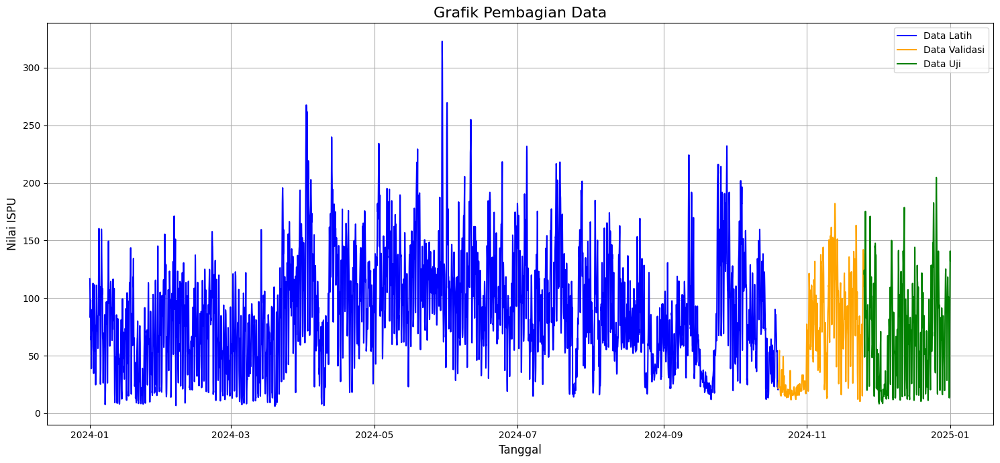


 Data Setelah Normalisasi


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.losses import MeanSquaredError
from math import sqrt
import os

# --- 1. Custom Metric ---
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# --- 2. Load & Preprocess Data ---
data = pd.read_csv('/content/05-data_ISPU_2024.csv')
data['Waktu'] = pd.to_datetime(data['Waktu'])

# Drop 'Kategori' jika ada dan tidak diinginkan sebagai fitur
if 'Kategori' in data.columns:
    data = data.drop(columns=['Kategori'])

# Define ALL columns as target columns for prediction (6 pollutants + 'Nilai ISPU')
target_columns = data.drop(columns=['Waktu']).columns.tolist()

# Separate input features and the target features
timestamps = data['Waktu'].values

# Input features will include all columns except 'Waktu'
input_features_df = data.drop(columns=['Waktu'])
target_feature_df = data.drop(columns=['Waktu']) # TARGET JUGA SEMUA 7 KOLOM

input_values = input_features_df.values
target_values = target_feature_df.values

# Assert the number of input features
num_input_features = input_features_df.shape[1]
print(f"Number of input features: {num_input_features}")
assert num_input_features == 7, f"Expected 7 input features (6 pollutants + ISPU), got {num_input_features}"
input_feature_names = input_features_df.columns.tolist()
print(f"Input feature names: {input_feature_names}")
print(f"Output target names: {target_columns}")


# --- 3. Split Data ---
n_total = len(input_values)
n_train = int(n_total * 0.80)
n_val = int(n_total * 0.10)
n_test = n_total - n_train - n_val

# Splitting input features data
train_input_data = input_values[:n_train]
val_input_data = input_values[n_train:n_train + n_val]
test_input_data = input_values[n_train + n_val:]

# Splitting target feature data
train_target_data = target_values[:n_train]
val_target_data = target_values[n_train:n_train + n_val]
test_target_data = target_values[n_train + n_val:]

train_time = timestamps[:n_train]
val_time = timestamps[n_train:n_train + n_val]
test_time = timestamps[n_train + n_val:]

# ==== Plot Data Division ====
print("\n Grafik Pembagian Data ")
plt.figure(figsize=(15, 7))
plt.plot(data['Waktu'].iloc[:n_train], data['Nilai ISPU'].iloc[:n_train], 'blue', label='Data Latih')
plt.plot(data['Waktu'].iloc[n_train-1 : n_train + n_val], data['Nilai ISPU'].iloc[n_train-1 : n_train + n_val], 'orange', label='Data Validasi')
plt.plot(data['Waktu'].iloc[n_train + n_val - 1 : ], data['Nilai ISPU'].iloc[n_train + n_val - 1 : ], 'green', label='Data Uji')

plt.title('Grafik Pembagian Data', fontsize=16)
plt.xlabel('Tanggal', fontsize=12)
plt.ylabel('Nilai ISPU', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


print("\n Data Setelah Normalisasi")

# --- 4. Normalisasi ---
# Create separate scalers for input features and the target feature
input_scaler = MinMaxScaler()
target_scaler = MinMaxScaler() # target_scaler now scales all 7 output features

train_input_scaled = input_scaler.fit_transform(train_input_data)
train_target_scaled = target_scaler.fit_transform(train_target_data)

val_input_scaled = input_scaler.transform(val_input_data)
val_target_scaled = target_scaler.transform(val_target_data)

test_input_scaled = input_scaler.transform(test_input_data)
test_target_scaled = target_scaler.transform(test_target_data)


# --- 5. Sequence Maker ---
def create_sequences(input_data, target_data, lookback):
    """
    Creates sequences for time series prediction.
    X contains the input features for 'lookback' steps.
    y contains ALL target features at the next step.
    """
    X, y = [], []
    for i in range(len(input_data) - lookback):
        X.append(input_data[i:i + lookback])
        y.append(target_data[i + lookback]) # y now appends all target features
    return np.array(X), np.array(y)

# --- 6. Hyperparameters ---
lookback = 24 # Menggunakan lookback yang Anda berikan
grulayers = [128, 64, 32] # Arsitektur GRU yang Anda berikan
batch_size = 32
lr = 0.001
epochs = 68

# --- 7. Buat Dataset Berdasarkan Lookback ---
X_train, y_train = create_sequences(train_input_scaled, train_target_scaled, lookback)
X_val, y_val = create_sequences(val_input_scaled, val_target_scaled, lookback)
X_test, y_test = create_sequences(test_input_scaled, test_target_scaled, lookback)


--- Model Summary ---


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_6 (GRU)                     │ (None, 24, 128)        │        52,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_7 (GRU)                     │ (None, 24, 64)         │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_8 (GRU)                     │ (None, 32)             │         9,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           231 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,495 (388.65 KB)

 Trainable params: 99,495 (388.65 KB)

 Non-trainable params: 0 (0.00 B)


Memulai pelatihan selama 68 epoch...
Epoch   1: Train MSE=0.0078, Val MSE=0.0021, Test MSE=0.0028 | Train RMSE=0.0821, Val RMSE=0.0418, Test RMSE=0.0532
Epoch   2: Train MSE=0.0023, Val MSE=0.0012, Test MSE=0.0017 | Train RMSE=0.0474, Val RMSE=0.0321, Test RMSE=0.0416
Epoch   3: Train MSE=0.0018, Val MSE=0.0010, Test MSE=0.0014 | Train RMSE=0.0418, Val RMSE=0.0283, Test RMSE=0.0377
Epoch   4: Train MSE=0.0015, Val MSE=0.0010, Test MSE=0.0014 | Train RMSE=0.0384, Val RMSE=0.0284, Test RMSE=0.0368
Epoch   5: Train MSE=0.0014, Val MSE=0.0009, Test MSE=0.0012 | Train RMSE=0.0363, Val RMSE=0.0271, Test RMSE=0.0348
Epoch   6: Train MSE=0.0013, Val MSE=0.0008, Test MSE=0.0011 | Train RMSE=0.0352, Val RMSE=0.0254, Test RMSE=0.0332
Epoch   7: Train MSE=0.0013, Val MSE=0.0008, Test MSE=0.0011 | Train RMSE=0.0350, Val RMSE=0.0271, Test RMSE=0.0335
Epoch   8: Train MSE=0.0012, Val MSE=0.0007, Test MSE=0.0011 | Train RMSE=0.0339, Val RMSE=0.0256, Test RMSE=0.0324
Epoch   9: Train MSE=0.0011, Val M


  FINAL MODEL METRICS SUMMARY (MULTI-TARGET Prediction)

--- Normalized Metrics ---
Train MSE:  0.0003
Val   MSE:  0.0004
Test  MSE:  0.0005
Train RMSE: 0.0185
Val   RMSE: 0.0196
Test  RMSE: 0.0230

--- Denormalized Metrics ---
Train MSE:  710.7772
Val   MSE:  951.1056
Test  MSE:  1383.3507
Train RMSE: 26.6604
Val   RMSE: 30.8400
Test  RMSE: 37.1934

Model terlatih disimpan sebagai 'final_gru_multi_target_model_7_inputs_7_outputs.h5'

Menghasilkan visualisasi kurva MSE dan menyimpannya di folder: loss_plots_multi_target_7_inputs_7_outputs

Menghasilkan visualisasi prediksi vs asli untuk setiap fitur target di data test dan menyimpannya di folder: predictions_multi_target_7_inputs_7_outputs



Menyimpan hasil prediksi test dan data asli test untuk semua fitur target ke CSV...
File 'prediksi_asli_test_multi_target_7_inputs_7_outputs.csv' telah dibuat.

  MENAMPILKAN BOBOT DAN BIAS DARI MODEL GRU YANG TELAH DILATIH (MULTI-TARGET)
  (Menampilkan sekitar 50 nilai per dimensi untuk ringkasan)

Berhasil memuat model dari: final_gru_multi_target_model_7_inputs_7_outputs.h5

--- Ringkasan Model yang Dimuat ---


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_6 (GRU)                     │ (None, 24, 128)        │        52,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_7 (GRU)                     │ (None, 24, 64)         │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_8 (GRU)                     │ (None, 32)             │         9,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           231 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,497 (388.66 KB)

 Trainable params: 99,495 (388.65 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)


--- Detail Bobot dan Bias untuk Setiap Layer ---

  LAYER 1: GRU_6 (Tipe: GRU)
  > Kernel Weights (Input to Gates) (Shape: (7, 384)):
    Sub-matriks (pertama 7x50):
[[-0.3547, -0.082 , -0.1166, -0.4704, -0.6003, -0.111 , -0.1873, -0.5684,
   0.1393, -0.1469, -0.1242, -0.2509, -0.0606, -0.1391, -0.0878, -0.3756,
  -0.0998, -0.1645, -0.4281, -0.1511, -0.1616, -0.6422, -0.0874, -0.1998,
  -0.3588, -0.2846, -0.0963, -0.0891, -0.2734, -0.4632, -0.3536, -0.1221,
  -0.0088, -0.399 , -0.3647, -0.2138, -0.3839, -0.3197, -0.2398, -0.2806,
  -0.0891, -0.1587,  0.4013, -0.1058, -0.2323, -0.2794,  0.1705,  0.0046,
   0.4851,  0.4635],
 [-0.3179, -0.1407, -0.1957, -0.5112, -0.6116, -0.0084, -0.1333, -0.3749,
   0.0994, -0.2323, -0.0444, -0.3675, -0.0976, -0.161 , -0.2253, -0.4049,
  -0.2361, -0.1875, -0.4391, -0.2765, -0.2432, -0.6318, -0.2533, -0.2542,
  -0.3244, -0.3395, -0.1539,  0.0448, -0.3332, -0.3729, -0.1482, -0.3119,
   0.1106, -0.2991, -0.3036, -0.0524, -0.3047, -0.2448, -0.4273, -0.4409

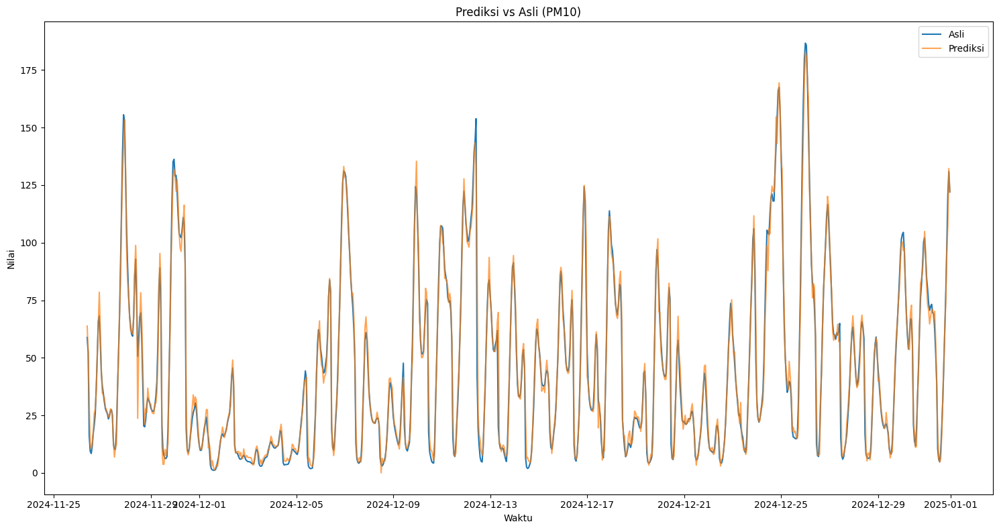

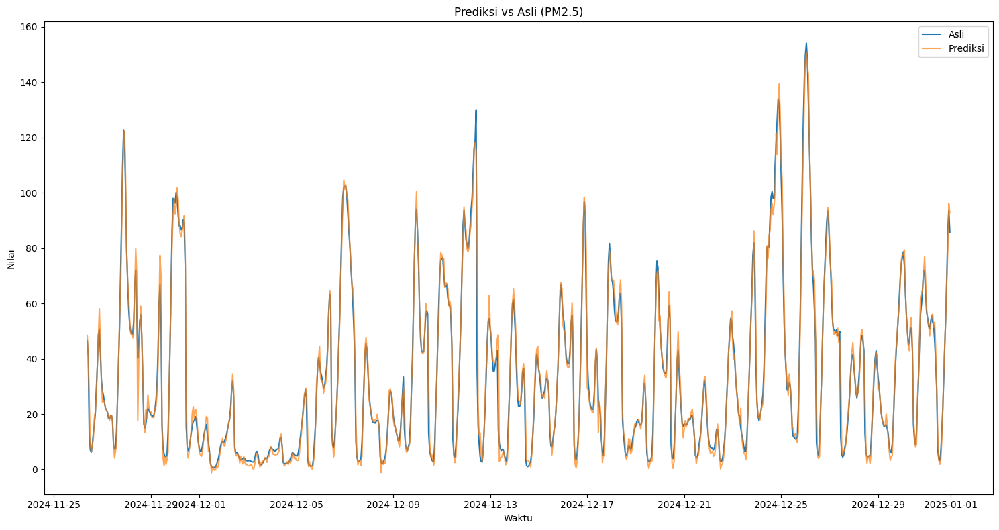

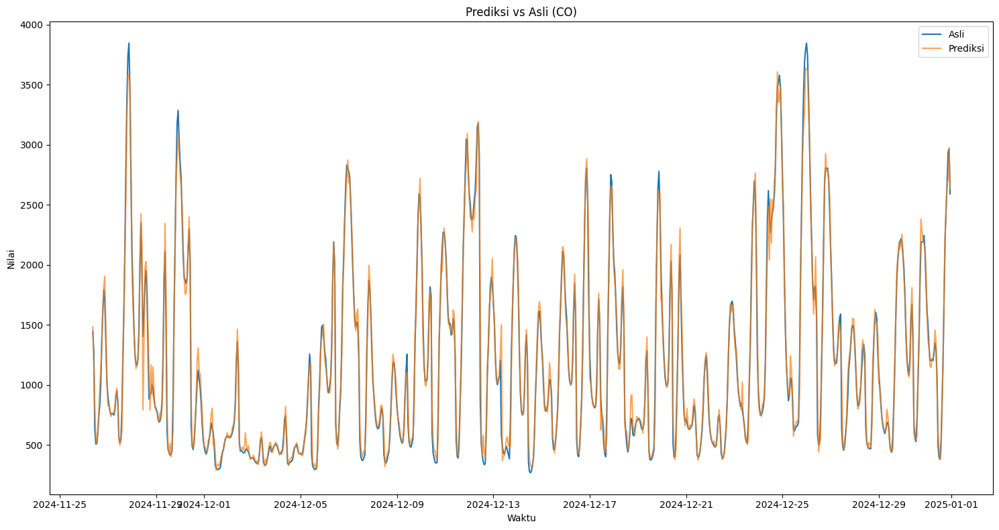

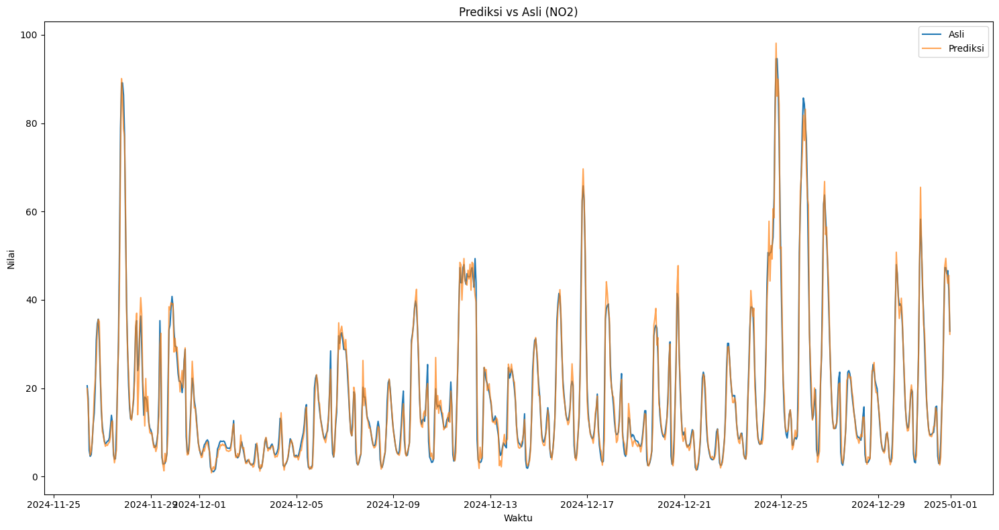

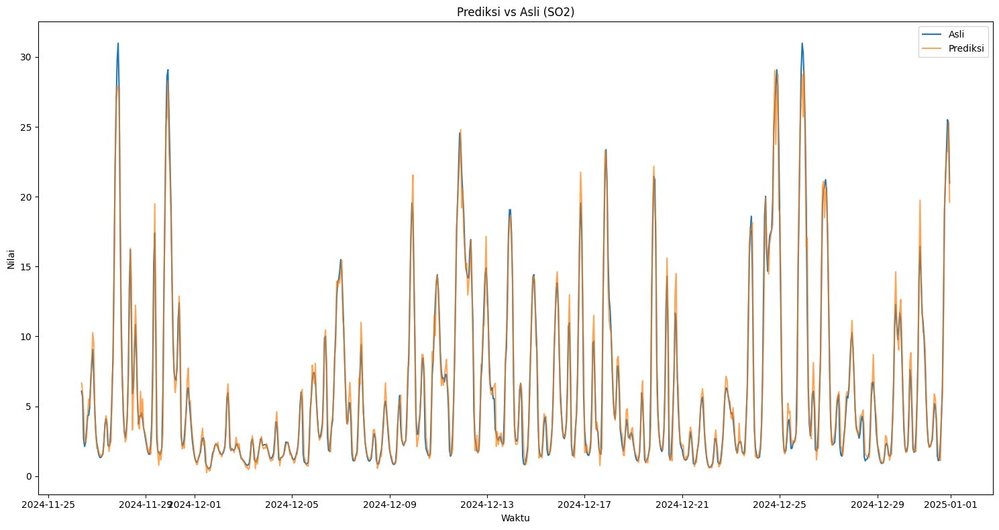

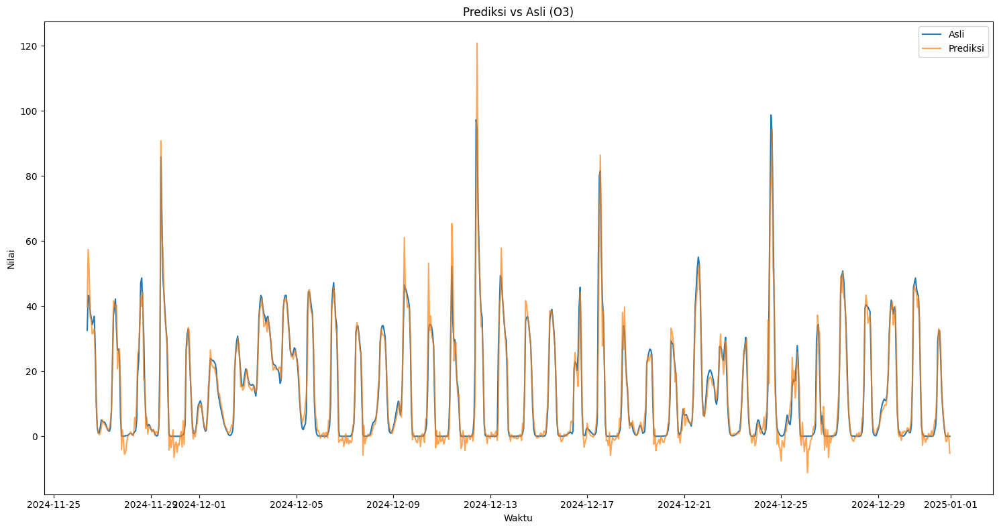

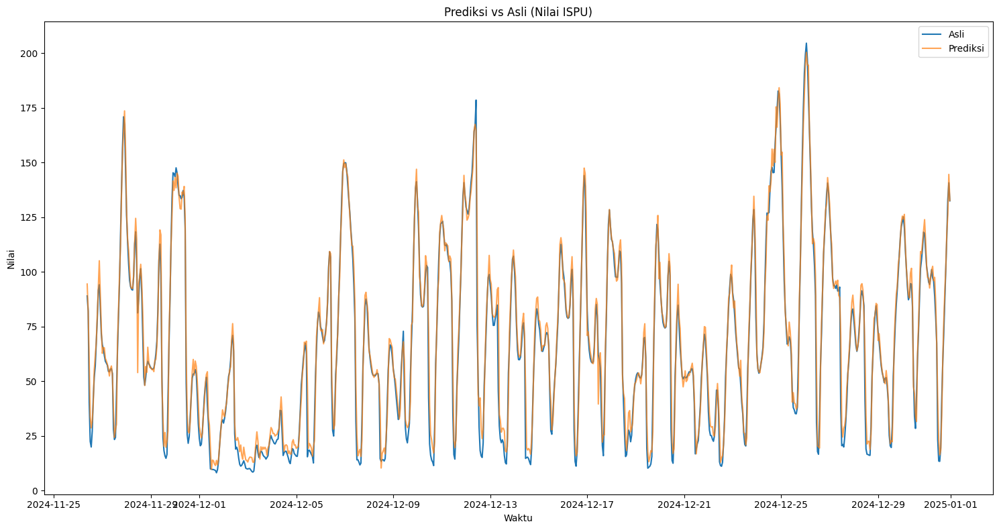

In [ ]:
# --- 8. Build Model GRU ---
model = Sequential()
# Input shape: (lookback, num_input_features) - num_input_features = 7
model.add(Input(shape=(lookback, X_train.shape[2])))
model.add(GRU(grulayers[0], return_sequences=True))
model.add(GRU(grulayers[1], return_sequences=True))
model.add(GRU(grulayers[2]))
model.add(Dense(len(target_columns))) # OUTPUT LAYER SEKARANG MEMPREDIKSI SEMUA 7 KOLOM

model.compile(optimizer=Adam(learning_rate=lr),
              loss='mse',
              metrics=['mse', root_mean_squared_error])

print("\n--- Model Summary ---")
model.summary()

# --- 9. Training Manual Per Epoch & Mengumpulkan Metrik ---
train_mse_list = []
val_mse_list = []
test_mse_list = []
train_rmse_list = []
val_rmse_list = []
test_rmse_list = []

print(f"\nMemulai pelatihan selama {epochs} epoch...")
for epoch in range(epochs):
    history = model.fit(X_train, y_train,
                        validation_data=(X_val, y_val),
                        epochs=1,
                        batch_size=batch_size,
                        verbose=0)

    y_test_pred_norm = model.predict(X_test, verbose=0)

    current_test_mse = mean_squared_error(y_test, y_test_pred_norm)
    current_test_rmse = sqrt(current_test_mse)

    train_mse_list.append(history.history['mse'][0])
    val_mse_list.append(history.history['val_mse'][0])
    train_rmse_list.append(history.history['root_mean_squared_error'][0])
    val_rmse_list.append(history.history['val_root_mean_squared_error'][0])
    test_mse_list.append(current_test_mse)
    test_rmse_list.append(current_test_rmse)

    print(f"Epoch {epoch+1:3d}: Train MSE={train_mse_list[-1]:.4f}, Val MSE={val_mse_list[-1]:.4f}, Test MSE={current_test_mse:.4f} | "
          f"Train RMSE={train_rmse_list[-1]:.4f}, Val RMSE={val_rmse_list[-1]:.4f}, Test RMSE={current_test_rmse:.4f}")

# --- 10. Evaluasi Final untuk Semua Set (Normalized & Denormalized) ---
y_train_pred_norm = model.predict(X_train, verbose=0)
y_val_pred_norm = model.predict(X_val, verbose=0)
y_test_pred_norm = model.predict(X_test, verbose=0)

y_train_true_denorm = target_scaler.inverse_transform(y_train)
y_train_pred_denorm = target_scaler.inverse_transform(y_train_pred_norm)
#y_train_pred_denorm = np.clip(y_train_pred_denorm, 0, None) # Pastikan nilai tidak negatif

y_val_true_denorm = target_scaler.inverse_transform(y_val)
y_val_pred_denorm = target_scaler.inverse_transform(y_val_pred_norm)
#y_val_pred_denorm = np.clip(y_val_pred_denorm, 0, None) # Pastikan nilai tidak negatif

y_test_true_denorm = target_scaler.inverse_transform(y_test)
y_test_pred_denorm = target_scaler.inverse_transform(y_test_pred_norm)
#y_test_pred_denorm = np.clip(y_test_pred_denorm, 0, None) # Pastikan nilai tidak negatif


# Hitung Metrik Final (Normalized)
final_train_mse_norm = mean_squared_error(y_train, y_train_pred_norm)
final_val_mse_norm = mean_squared_error(y_val, y_val_pred_norm)
final_test_mse_norm = mean_squared_error(y_test, y_test_pred_norm)

final_train_rmse_norm = sqrt(final_train_mse_norm)
final_val_rmse_norm = sqrt(final_val_mse_norm)
final_test_rmse_norm = sqrt(final_test_mse_norm)

# Hitung Metrik Final (Denormalized)
final_train_mse_denorm = mean_squared_error(y_train_true_denorm, y_train_pred_denorm)
final_val_mse_denorm = mean_squared_error(y_val_true_denorm, y_val_pred_denorm)
final_test_mse_denorm = mean_squared_error(y_test_true_denorm, y_test_pred_denorm)

final_train_rmse_denorm = sqrt(final_train_mse_denorm)
final_val_rmse_denorm = sqrt(final_val_mse_denorm)
final_test_rmse_denorm = sqrt(final_test_mse_denorm)


# --- Tampilan Semua Metrik Final ---
print("\n" + "="*50)
print("  FINAL MODEL METRICS SUMMARY (MULTI-TARGET Prediction)")
print("="*50)

print("\n--- Normalized Metrics ---")
print(f"Train MSE:  {final_train_mse_norm:.4f}")
print(f"Val   MSE:  {final_val_mse_norm:.4f}")
print(f"Test  MSE:  {final_test_mse_norm:.4f}")
print(f"Train RMSE: {final_train_rmse_norm:.4f}")
print(f"Val   RMSE: {final_val_rmse_norm:.4f}")
print(f"Test  RMSE: {final_test_rmse_norm:.4f}")

print("\n--- Denormalized Metrics ---")
print(f"Train MSE:  {final_train_mse_denorm:.4f}")
print(f"Val   MSE:  {final_val_mse_denorm:.4f}")
print(f"Test  MSE:  {final_test_mse_denorm:.4f}")
print(f"Train RMSE: {final_train_rmse_denorm:.4f}")
print(f"Val   RMSE: {final_val_rmse_denorm:.4f}")
print(f"Test  RMSE: {final_test_rmse_denorm:.4f}")
print("="*50)


# --- 11. Simpan Model Terlatih ---
model_save_path = 'final_gru_multi_target_model_7_inputs_7_outputs.h5' # Nama file baru
model.save(model_save_path)
print(f"\nModel terlatih disimpan sebagai '{model_save_path}'")

# --- 12. Visualisasi Kurva Loss (HANYA MSE) ---
output_loss_folder = 'loss_plots_multi_target_7_inputs_7_outputs' # Nama folder baru
os.makedirs(output_loss_folder, exist_ok=True)

print(f"\nMenghasilkan visualisasi kurva MSE dan menyimpannya di folder: {output_loss_folder}")

# --- Plot MSE Curves ---
plt.figure(figsize=(15, 8))
plt.plot(train_mse_list, label='Train MSE')
plt.plot(val_mse_list, label='Val MSE')
plt.title(f'Train vs Val MSE (Multi-Target)') # Judul disesuaikan
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.ylim(0, 0.02)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(output_loss_folder, 'mse_train_val_curve.png'))
plt.close()

plt.figure(figsize=(15, 8))
plt.plot(test_mse_list, label='Test MSE', color='orange')
plt.title(f'Test MSE (Multi-Target)') # Judul disesuaikan
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.ylim(0, 0.02)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(output_loss_folder, 'mse_test_curve.png'))
plt.close()

plt.figure(figsize=(15, 8))
plt.plot(train_mse_list, label='Train MSE')
plt.plot(val_mse_list, label='Val MSE')
plt.plot(test_mse_list, label='Test MSE')
plt.title(f'Train, Val, and Test MSE (Multi-Target)') # Judul disesuaikan
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.ylim(0, 0.02)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(output_loss_folder, 'mse_combined_curve.png'))
plt.close()


# --- 13. Visualisasi Prediksi vs Asli untuk Setiap Target ---
output_pred_folder = 'predictions_multi_target_7_inputs_7_outputs' # Nama folder baru
os.makedirs(output_pred_folder, exist_ok=True)

print(f"\nMenghasilkan visualisasi prediksi vs asli untuk setiap fitur target di data test dan menyimpannya di folder: {output_pred_folder}")

start_index_test_for_plot = lookback # Menggunakan lookback yang Anda berikan
test_time_plot = test_time[start_index_test_for_plot : start_index_test_for_plot + len(y_test_true_denorm)]

for i, feature_name in enumerate(target_columns):
    plt.figure(figsize=(15, 8))
    plt.plot(test_time_plot, y_test_true_denorm[:, i], label='Asli') # Plot untuk setiap kolom target
    plt.plot(test_time_plot, y_test_pred_denorm[:, i], label='Prediksi', alpha=0.7) # Plot untuk setiap kolom target
    plt.title(f'Prediksi vs Asli ({feature_name})')
    plt.xlabel('Waktu')
    plt.ylabel('Nilai')
    plt.legend()
    # Menghapus pengaturan ylim dinamis, kembali ke skala otomatis matplotlib
    plt.tight_layout()
    plt.savefig(os.path.join(output_pred_folder, f'prediction_vs_actual_{feature_name.replace(" ", "_")}.png'))


# --- 14. Simpan Hasil Prediksi Test ke CSV ---
print(f"\nMenyimpan hasil prediksi test dan data asli test untuk semua fitur target ke CSV...")
df_results_multi_target = pd.DataFrame({'Waktu': test_time_plot})
for i, feature_name in enumerate(target_columns):
    df_results_multi_target[f'Asli_{feature_name}'] = y_test_true_denorm[:, i]
    df_results_multi_target[f'Prediksi_{feature_name}'] = y_test_pred_denorm[:, i]

df_results_multi_target.to_csv('prediksi_asli_test_multi_target_7_inputs_7_outputs.csv', index=False) # Nama file baru
print("File 'prediksi_asli_test_multi_target_7_inputs_7_outputs.csv' telah dibuat.")

## Menampilkan Bobot dan Bias Model Terlatih

print("\n" + "="*70)
print("  MENAMPILKAN BOBOT DAN BIAS DARI MODEL GRU YANG TELAH DILATIH (MULTI-TARGET)") # Judul disesuaikan
print("  (Menampilkan sekitar 50 nilai per dimensi untuk ringkasan)")
print("="*70)

model_path = model_save_path # Menggunakan path model yang sudah disimpan

if os.path.exists(model_path):
    try:
        loaded_model = load_model(model_path, custom_objects={
            'root_mean_squared_error': root_mean_squared_error,
            'mse': MeanSquaredError()
        })

        print(f"\nBerhasil memuat model dari: {model_path}")
        print("\n--- Ringkasan Model yang Dimuat ---")
        loaded_model.summary()

        print("\n--- Detail Bobot dan Bias untuk Setiap Layer ---")
        for i, layer in enumerate(loaded_model.layers):
            weights_and_biases = layer.get_weights()

            if weights_and_biases:
                print(f"\n" + "="*50)
                print(f"  LAYER {i+1}: {layer.name.upper()} (Tipe: {layer.__class__.__name__})")
                print("="*50)

                for j, wb_tensor in enumerate(weights_and_biases):
                    param_type = ""
                    if layer.name.startswith('gru'):
                        if j == 0: param_type = "Kernel Weights (Input to Gates)"
                        elif j == 1: param_type = "Recurrent Kernel Weights (Hidden to Gates)"
                        elif j == 2: param_type = "Bias"
                    elif layer.name.startswith('dense'):
                        if j == 0: param_type = "Weights"
                        elif j == 1: param_type = "Biases"
                    else:
                        param_type = f"Parameter {j}"

                    print(f"  > {param_type} (Shape: {wb_tensor.shape}):")

                    if wb_tensor.ndim == 1:
                        display_len = min(len(wb_tensor), 50)
                        if display_len < len(wb_tensor):
                            print(f"    [ {', '.join(f'{x:.4f}' for x in wb_tensor[:display_len])} ... (dipotong) ]")
                        else:
                            print(f"    {wb_tensor}")
                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")

                    elif wb_tensor.ndim == 2:
                        rows_to_display = min(wb_tensor.shape[0], 50)
                        cols_to_display = min(wb_tensor.shape[1], 50)

                        print(f"    Sub-matriks (pertama {rows_to_display}x{cols_to_display}):")
                        print(np.array2string(wb_tensor[:rows_to_display, :cols_to_display], precision=4, separator=', ', suppress_small=True))

                        if rows_to_display < wb_tensor.shape[0] or cols_to_display < wb_tensor.shape[1]:
                            print("    ... (dipotong)")

                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")
                    else:
                        print(f"    {np.array2string(wb_tensor, precision=4, separator=', ', suppress_small=True)}")
                        print(f"    Min Value: {np.min(wb_tensor):.6f}, Max Value: {np.max(wb_tensor):.6f}")
                    print("-" * 50)

            else:
                print(f"\nLayer {i+1}: {layer.name.upper()} (Tipe: {layer.__class__.__name__}) - Tidak memiliki bobot yang bisa dilatih.")

    except Exception as e:
        print(f"\nError memuat atau memeriksa model: {e}")
        print("Pastikan:")
        print(f"1. File model '{model_path}' ada di direktori saat ini.")
        print(f"2. Metrik kustom 'root_mean_squared_error' dan 'mse' (MeanSquaredError) didefinisikan secara identik seperti saat disimpan/dikompilasi.")
else:
    print(f"\nError: File model '{model_path}' tidak ditemukan.")
    print(f"Pastikan Anda telah melatih model dan menyimpannya sebagai '{model_save_path}' di direktori yang sama.")

print("\n" + "="*70)
print("  TAMPILAN BOBOT DAN BIAS SELESAI")
print("="*70)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, Dense, Input
from tensorflow.keras import backend as K
from tensorflow.keras.losses import MeanSquaredError # Penting untuk memuat MSE jika digunakan
from math import sqrt
import os

# --- 1. Definisi Fungsi Kustom ---

# Metric kustom root_mean_squared_error
# Sangat penting untuk memuat model yang dilatih dengan metrik ini
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# Fungsi untuk membuat sekuens data
def create_sequences(input_data, target_data, lookback):
    """
    Membuat sekuens untuk prediksi deret waktu.
    X berisi fitur input untuk 'lookback' langkah.
    y berisi SEMUA fitur target pada langkah berikutnya.
    """
    X, y = [], []
    for i in range(len(input_data) - lookback):
        X.append(input_data[i:i + lookback])
        y.append(target_data[i + lookback])
    return np.array(X), np.array(y)

# --- 2. Load dan Pra-pemrosesan Data ---
print("1. Memuat dan melakukan pra-pemrosesan data...")
# Pastikan path file ini benar sesuai lokasi di komputer Anda
data_file_path = '/content/05-data_ISPU_2024.csv'
if not os.path.exists(data_file_path):
    print(f"ERROR: File data '{data_file_path}' tidak ditemukan.")
    print("Pastikan file berada di direktori yang sama atau ubah 'data_file_path' ke lokasi yang benar.")
    exit() # Keluar jika file tidak ditemukan

data = pd.read_csv(data_file_path)
data['Waktu'] = pd.to_datetime(data['Waktu'])
data = data.drop(columns=['Kategori'])

# Semua kolom selain 'Waktu' dianggap sebagai fitur input DAN fitur target
target_columns = data.drop(columns=['Waktu']).columns.tolist()

input_features_df = data.drop(columns=['Waktu'])
target_feature_df = data.drop(columns=['Waktu'])

input_values = input_features_df.values
target_values = target_feature_df.values

# --- 3. Pembagian Data (Mengikuti Rasio Asli) ---
print("2. Membagi data menjadi train, validasi, dan test...")
n_total = len(data)
n_train = int(n_total * 0.80)
n_val = int(n_total * 0.10)
n_test = n_total - n_train - n_val

train_input_data = input_values[:n_train]
val_input_data = input_values[n_train : n_train + n_val]
test_input_data = input_values[n_train + n_val : ]

train_target_data = target_values[:n_train]
val_target_data = target_values[n_train : n_train + n_val]
test_target_data = target_values[n_train + n_val : ]

# --- 4. Normalisasi Data ---
print("3. Melakukan normalisasi data...")
scaler_features = MinMaxScaler()
scaler_target = MinMaxScaler() # Skaler terpisah untuk target

# Fit dan transform data training
X_train_scaled = scaler_features.fit_transform(train_input_data)
y_train_scaled = scaler_target.fit_transform(train_target_data)

# Transform data test (menggunakan skaler yang sudah fit dari data train)
X_test_scaled = scaler_features.transform(test_input_data)
y_test_scaled = scaler_target.transform(test_target_data)

# --- 5. Ambil Lookback dari Hasil Model Terbaik yang Tersimpan ---
print("4. Mencari nilai lookback dari hasil pelatihan terbaik...")
best_model_lookback = None
results_file_path = '/content/prediksi_asli_test_multi_target_7_inputs_7_outputs.csv'
if os.path.exists(results_file_path):
    try:
        results_df = pd.read_csv(results_file_path)
        # Ambil lookback dari baris dengan Val RMSE terendah
        best_model_row = results_df.loc[results_df['Val RMSE'].idxmin()]
        best_model_lookback = int(best_model_row['Lookback'])
        print(f"  Lookback terbaik yang ditemukan dari '{results_file_path}': {best_model_lookback}")
    except Exception as e:
        print(f"  Gagal membaca lookback dari '{results_file_path}': {e}")
else:
    print(f"  Peringatan: File hasil '{results_file_path}' tidak ditemukan.")

if best_model_lookback is None:
    # Fallback jika file hasil tidak ada atau gagal dibaca
    # Anda bisa menggantinya dengan nilai lookback yang Anda ingat
    best_model_lookback = 24
    print(f"  Menggunakan nilai lookback default: {best_model_lookback}")


# --- 6. Buat Urutan Data Test untuk Prediksi ---
print(f"5. Membuat urutan data test dengan lookback = {best_model_lookback}...")
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, best_model_lookback)

# --- 7. Muat Model Terbaik ---
model_path = '/content/final_gru_multi_target_model_7_inputs_7_outputs.h5'
print(f"6. Memuat model terbaik dari '{model_path}'...")
loaded_model = None
if os.path.exists(model_path):
    try:
        loaded_model = load_model(model_path, custom_objects={
            'root_mean_squared_error': root_mean_squared_error,
            'mse': MeanSquaredError() # Sertakan MeanSquaredError juga
        })
        print("  Model berhasil dimuat.")
    except Exception as e:
        print(f"ERROR: Gagal memuat model. Pastikan metrik kustom dan kelas loss didefinisikan dengan benar saat memuat:\n {e}")
else:
    print(f"ERROR: File model '{model_path}' tidak ditemukan. Pastikan sudah ada di direktori yang sama.")

# --- 8. Lakukan Prediksi dan Inverse Transform ---
if loaded_model:
    print("7. Melakukan prediksi pada data test dan mengembalikan ke skala asli...")
    y_test_pred_scaled = loaded_model.predict(X_test_seq)

    # Inverse transform nilai target asli dan prediksi kembali ke skala aslinya
    y_test_true_orig = scaler_target.inverse_transform(y_test_seq)
    y_test_pred_orig = scaler_target.inverse_transform(y_test_pred_scaled)

    # --- 9. Hitung dan Tampilkan RMSE Per Fitur ---
    print("\n" + "="*70)
    print("  HASIL RMSE PER FITUR PADA DATA UJI (SKALA ASLI)")
    print("="*70)

    for i, feature_name in enumerate(target_columns):
        true_values_feature = y_test_true_orig[:, i]
        pred_values_feature = y_test_pred_orig[:, i]

        rmse_feature = sqrt(mean_squared_error(true_values_feature, pred_values_feature))
        print(f"  RMSE untuk '{feature_name}': {rmse_feature:.4f}")

    print("="*70)

    # Opsional: Hitung dan tampilkan RMSE rata-rata keseluruhan (untuk semua fitur)
    overall_rmse = sqrt(mean_squared_error(y_test_true_orig, y_test_pred_orig))
    print(f"\nRMSE Rata-rata Keseluruhan (untuk semua fitur): {overall_rmse:.4f}")
    print("----------------------------------------------------------------------")

else:
    print("\nTidak dapat melanjutkan karena model tidak berhasil dimuat. Mohon periksa pesan error di atas.")

print("\n--- Proses Perhitungan RMSE Per Fitur Selesai ---")

1. Memuat dan melakukan pra-pemrosesan data...
2. Membagi data menjadi train, validasi, dan test...
3. Melakukan normalisasi data...
4. Mencari nilai lookback dari hasil pelatihan terbaik...
  Gagal membaca lookback dari '/content/prediksi_asli_test_multi_target_7_inputs_7_outputs.csv': 'Val RMSE'
  Menggunakan nilai lookback default: 24
5. Membuat urutan data test dengan lookback = 24...
6. Memuat model terbaik dari '/content/final_gru_multi_target_model_7_inputs_7_outputs.h5'...
  Model berhasil dimuat.
7. Melakukan prediksi pada data test dan mengembalikan ke skala asli...
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

  HASIL RMSE PER FITUR PADA DATA UJI (SKALA ASLI)
  RMSE untuk 'PM10': 4.8719
  RMSE untuk 'PM2.5': 4.0615
  RMSE untuk 'CO': 97.8827
  RMSE untuk 'NO2': 2.3267
  RMSE untuk 'SO2': 0.9245
  RMSE untuk 'O3': 3.8858
  RMSE untuk 'Nilai ISPU': 6.3903

RMSE Rata-rata Keseluruhan (untuk semua fitur): 37.1934
----------------------------------------------------------------------


In [ ]:
Input: shape = (1, 4, 3)
Timesteps:       t0       t1       t2       t3
               [1,2,3]  [4,5,6]  [7,8,9]  [10,11,12]
                        │        │        │
GRU w/ return_sequences=True:
Output:         [..]     [..]     [..]     [..]   → shape (1, 4, units)

GRU w/ return_sequences=False:
Output:                              [..]         → shape (1, units) only from t3
